# Run 35 IV/dIdV Sweep 2

## Overview

Author: Maggie Reed
Last Updated: 05/29/2024

----
 
This notebook contains the analysis for IV sweeps taken 11/22/2023 (IV sweep 2 of 2) on the IrPtV2TESSmall, IrPtV2TESBig devices. More information on this run, its purpose, and other summaries can be found in the Run 35 shared Pyle google drive Analysis/Operation folder. 

NOTE: this data set was taken late in run with a higher signal gen setting. 

----
Data: November 22nd 2023

Time into run: Day8

Info on bias points etc: http://cosmology.berkeley.edu/wiki/lab/operation/run35_run_35_data_taking_summary

# Setup 

In [2]:
#basic imports
import pandas as pd
import time as tm
from glob import glob
import numpy as np
import scipy.constants as constants
#plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [10, 6.5]

#processing and analysis imports
from detprocess import DIDVAnalysis, IVSweepAnalysis, IVSweepProcessing
from pytesdaq.io.hdf5 import H5Reader
h5read = H5Reader() 

import qetpy
import pickle

In [3]:
# channels
channels = ['IrPtTESSmallV2','IrPtTESBigV2']

#small reprocessed data 
#/sdata2/runs/run35/filterdata/iv_didv_I2_D20231121_T155358/ivsweep_processing_D20240528_T105945.hdf5
sweep_data_path = ['/sdata2/runs/run35/raw/iv_didv_I2_D20231121_T155358/', #Irptsmall
                  '/sdata2/runs/run35/raw/iv_didv_I2_D20231122_T100201/'] #IrPtV2TESBig

basedir = ['/home/maggie_reed/analysis/run35/didv/figs/IrPtV2TESSmall/sweep3/',
           '/home/maggie_reed/analysis/run35/didv/figs/IrPtV2TESBig/sweep3/']
base_path = '/sdata2/runs/run35/filterdata/'
fs = 1.25e6

In [4]:
ivanalysis = IVSweepAnalysis(verbose=True, auto_save_hdf5=True)
ivanalysis_big = IVSweepAnalysis(verbose=True, auto_save_hdf5=True)

small_IrPt_data = base_path+'iv_didv_I2_D20231121_T155358/ivsweep_processing_D20240528_T120702.hdf5'
big_IrPt_data = base_path+'iv_didv_I2_D20231122_T100201/ivsweep_processing_D20240528_T124728.hdf5'
ivanalysis.set_data_from_file(small_IrPt_data)
ivanalysis_big.set_data_from_file(big_IrPt_data)

INFO: Results will be automatically saved in ivsweep_analysis_D20240529_T100813.hdf5
INFO: Results will be automatically saved in ivsweep_analysis_D20240529_T100813.hdf5
INFO: Loading filter data from file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231121_T155358/ivsweep_processing_D20240528_T120702.hdf5
INFO: Loading filter data from file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231122_T100201/ivsweep_processing_D20240528_T124728.hdf5


In [5]:
ivanalysis.describe()
ivanalysis_big.describe()

List of channels: ['IrPtTESSmallV2']

Channel IrPtTESSmallV2:
 * Tag "default":
    ivsweep_data: pandas.DataFrame  (25, 44)
       Nb SC points: 4
       Nb Normal points: 8
List of channels: ['IrPtTESBigV2']

Channel IrPtTESBigV2:
 * Tag "default":
    ivsweep_data: pandas.DataFrame  (26, 44)
       Nb SC points: 6
       Nb Normal points: Unknown


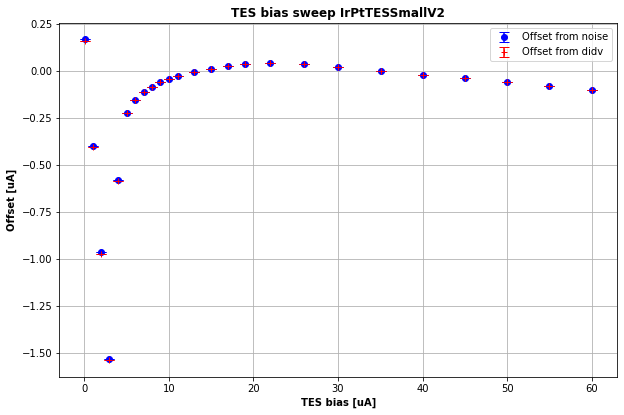

In [7]:
#just a quick check
ivanalysis.plot_ivsweep_offset(channel='IrPtTESSmallV2')

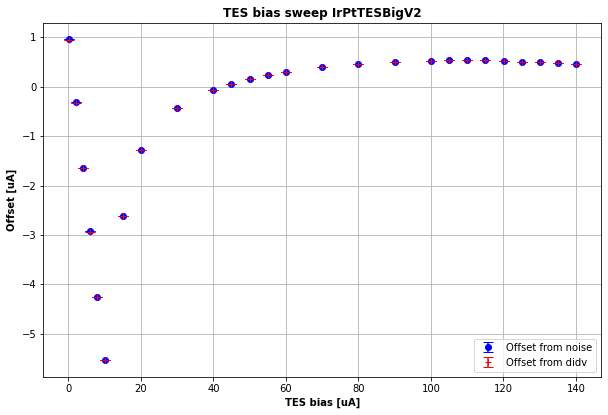

In [8]:
ivanalysis_big.plot_ivsweep_offset(channel='IrPtTESBigV2')

In [9]:
ivanalysis_big.set_nb_sc_normal_points('IrPtTESBigV2', nnorm=5)


# Analyze Sweep

## IrPt small

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231121_T155358/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


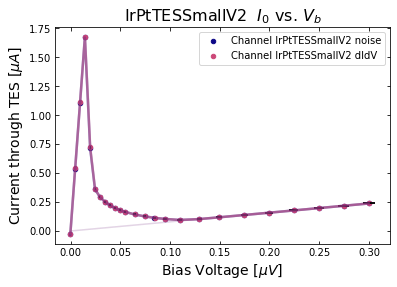

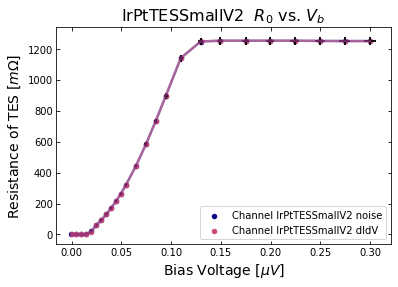

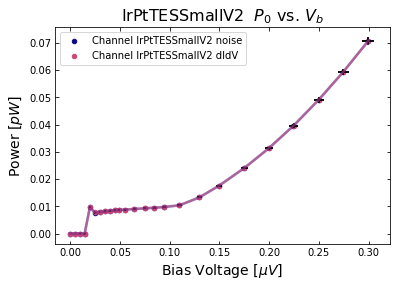

In [10]:
ivanalysis.analyze_sweep(lgc_plot=True, lgc_invert_offset='auto')

## IrPt Big

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231122_T100201/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


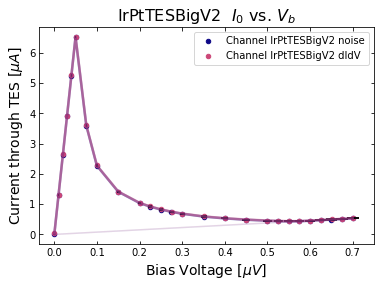

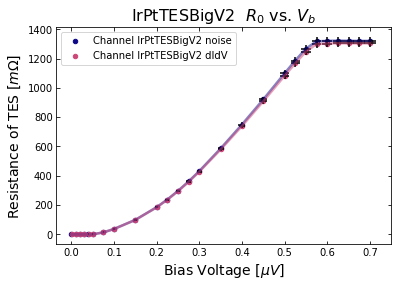

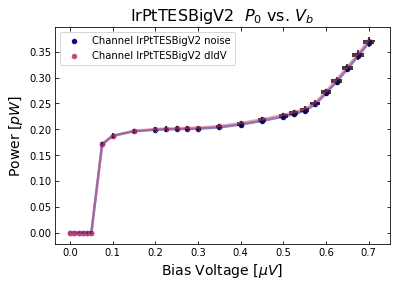

In [11]:
ivanalysis_big.analyze_sweep(lgc_plot=True, lgc_invert_offset='auto')

# Iv sweep results

In [12]:
result_small = ivanalysis.get_ivsweep_results('IrPtTESSmallV2')
result_small

{'rp': 0.0036195144599403626,
 'rp_err': 7.239028919880727e-05,
 'rn': 1.2542410147391012,
 'rn_err': 0.025257314325332427,
 'rshunt': 0.004999999888241291,
 'rshunt_err': 9.999999776482583e-05,
 'rsh': 0.004999999888241291,
 'rsh_err': 9.999999776482583e-05,
 'i0_off': -1.397420242955298e-07,
 'i0_off_err': 7.2346874029954305e-12,
 'ibias_off': 8.625466613452753e-08,
 'ibias_off_err': 1.6361608792372216e-11,
 'lgc_invert_offset': True,
 'close_loop_norm': 625000.0,
 'output_variable_offset': -0.08669108897447586,
 'output_variable_gain': 50.0,
 'group_name_sweep': 'iv_didv_I2_D20231121_T155358',
 'i0_variable_offset': -6.935287117958069e-06}

In [13]:
result_big = ivanalysis_big.get_ivsweep_results('IrPtTESBigV2')
result_big

{'rp': 0.0026428202592376675,
 'rp_err': 5.285640518475335e-05,
 'rn': 1.3208513839469347,
 'rn_err': 0.02656994590509208,
 'rshunt': 0.004999999888241291,
 'rshunt_err': 9.999999776482583e-05,
 'rsh': 0.004999999888241291,
 'rsh_err': 9.999999776482583e-05,
 'i0_off': -9.807945062211203e-07,
 'i0_off_err': 1.1964673766730595e-10,
 'ibias_off': 8.211460582123258e-09,
 'ibias_off_err': 1.841074405089259e-10,
 'lgc_invert_offset': True,
 'close_loop_norm': 625000.0,
 'output_variable_offset': -0.10134310275316238,
 'output_variable_gain': 50.0,
 'group_name_sweep': 'iv_didv_I2_D20231122_T100201',
 'i0_variable_offset': -8.10744822025299e-06}

# dIdV analysis

## Small


IrPtTESSmallV2 SC dIdV analysis


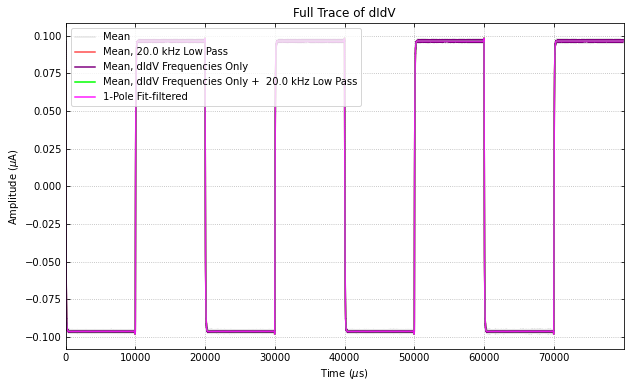

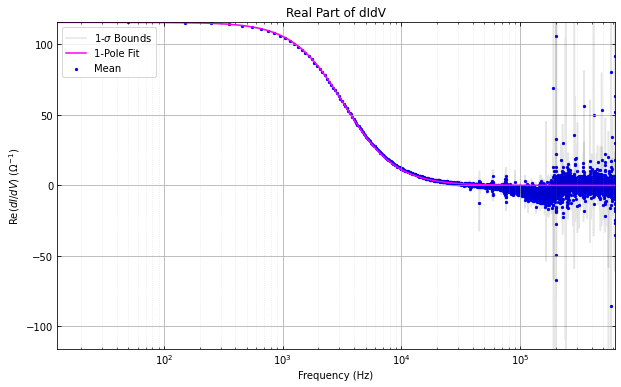

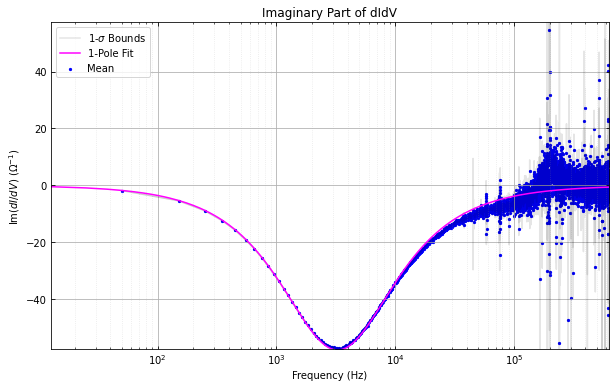

IrPtTESSmallV2 Rp from dIdV fit = 3.66 +/- 0.008 mOhms
IrPtTESSmallV2 Rp from IV Sweep = 3.62 +/- 0.072 mOhms
INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231121_T155358/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)

IrPtTESSmallV2 Normal dIdV analysis


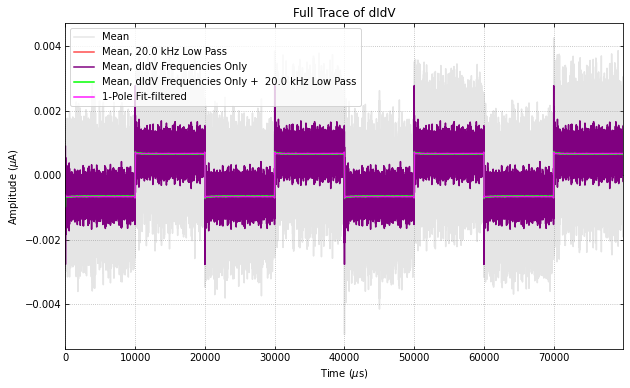

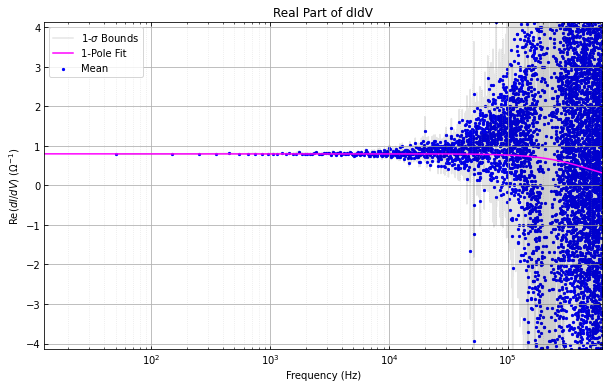

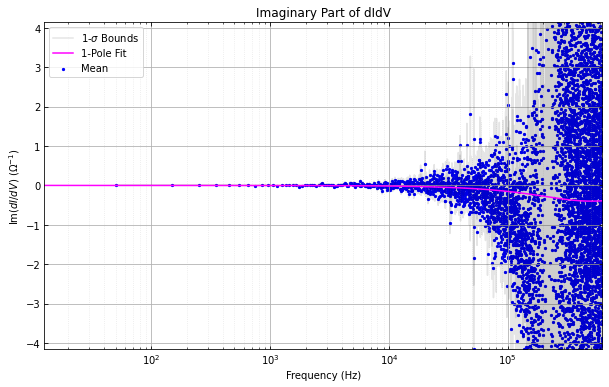

IrPtTESSmallV2 Rn from dIdV fit = 1235.58 +/- 9.463 mOhms
IrPtTESSmallV2 Rn from IV Sweep = 1254.24 +/- 25.257 mOhms
INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231121_T155358/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)

IrPtTESSmallV2 Transition dIdV analysis


IrPtTESSmallV2 TES bias 16.967 uA, R0 = 733.78 mOhms (% Rn = 58.50)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.144

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000545 s
Tau2: 5.27e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 5.28e-07 s
Tau_minus: 0.000626 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 9.888 +/- 0.7315
beta = 0.439 +/- 0.0

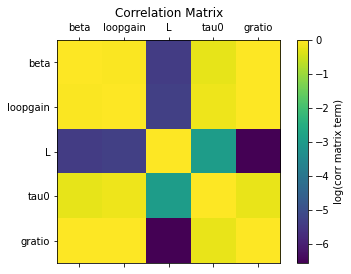

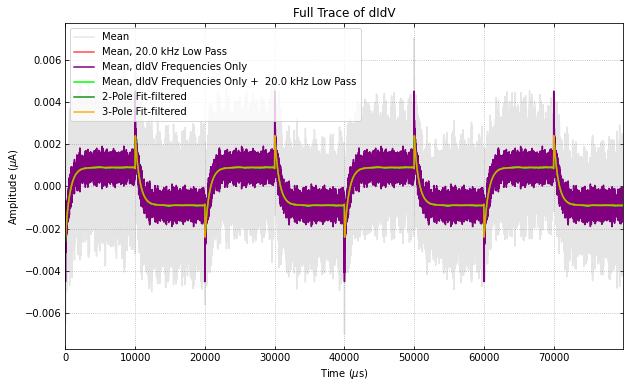

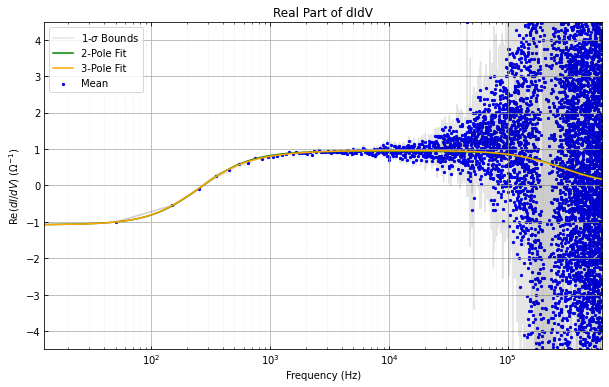

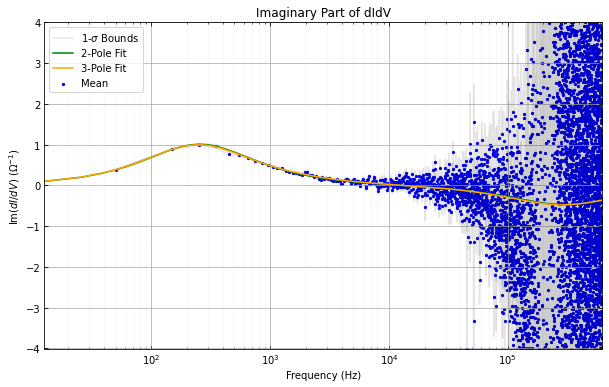



IrPtTESSmallV2 TES bias 15.013 uA, R0 = 584.30 mOhms (% Rn = 46.60)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.147

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000394 s
Tau2: 6.63e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 6.65e-07 s
Tau_minus: 0.000604 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 14.495 +/- 1.4086
beta = 0.819 +/- 0.0370
gratio = -0.000 +/- 0.0000
tau0 = 5.32 +/- 0.5549 ms
L = 710.492 +/- 53.9577 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.146

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000988 s
Tau2: 7.13e-07 s
Tau3: 0.0001068 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 7

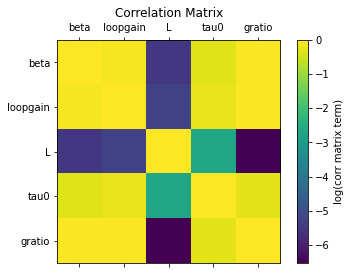

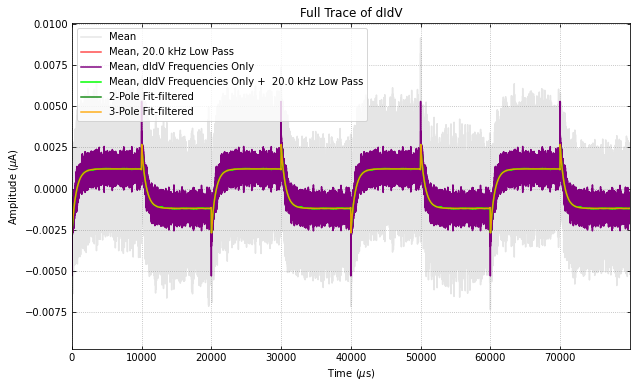

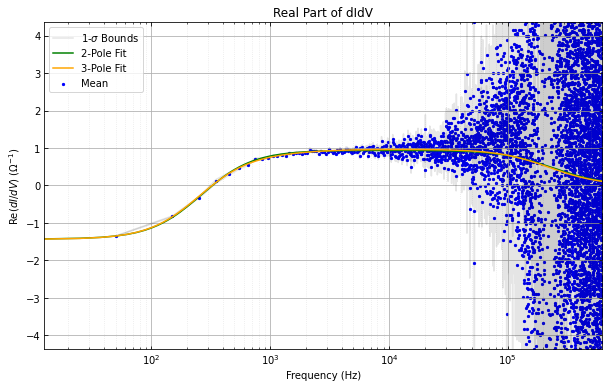

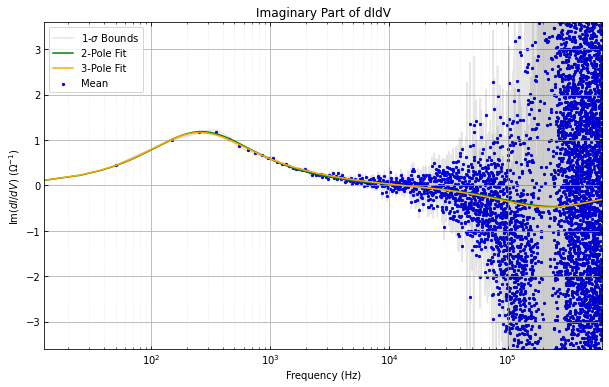



IrPtTESSmallV2 TES bias 12.978 uA, R0 = 442.70 mOhms (% Rn = 35.30)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.139

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000293 s
Tau2: 5.25e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 5.26e-07 s
Tau_minus: 0.000606 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 19.334 +/- 2.1132
beta = 1.402 +/- 0.0491
gratio = -0.000 +/- 0.0000
tau0 = 5.37 +/- 0.6183 ms
L = 562.742 +/- 48.0667 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.138

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000669 s
Tau2: 5.94e-07 s
Tau3: 7.933e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 5

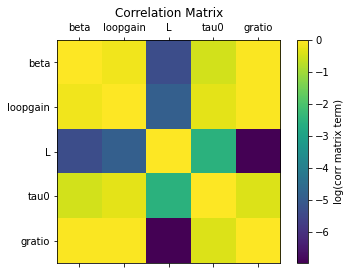

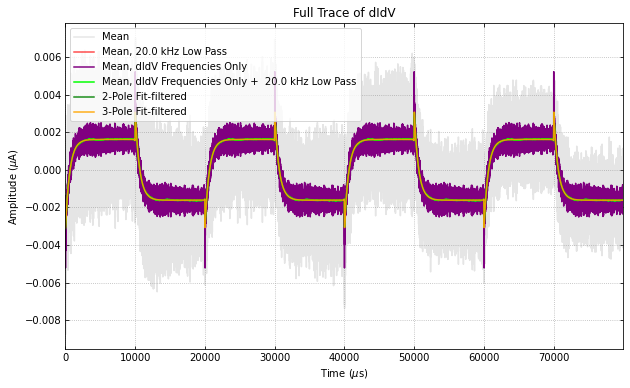

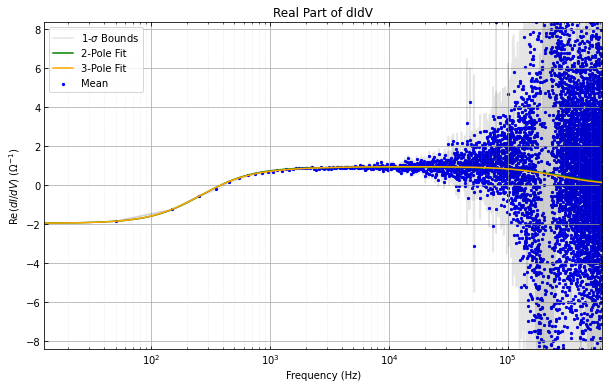

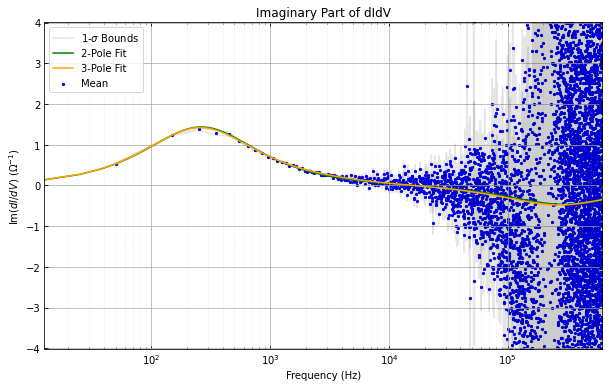



IrPtTESSmallV2 TES bias 11.025 uA, R0 = 322.43 mOhms (% Rn = 25.70)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.141

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000222 s
Tau2: 4.68e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 4.69e-07 s
Tau_minus: 0.000624 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 24.693 +/- 2.8208
beta = 2.209 +/- 0.0658
gratio = -0.000 +/- 0.0000
tau0 = 5.27 +/- 0.6273 ms
L = 487.832 +/- 41.2150 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.140

Fit time constants, NOT dIdV Poles: 
Tau1: 0.25 s
Tau2: 5.68e-07 s
Tau3: 4.941e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 5.71e

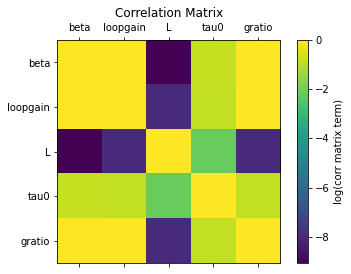

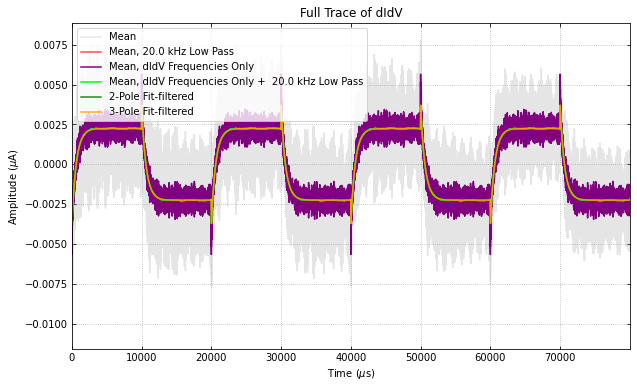

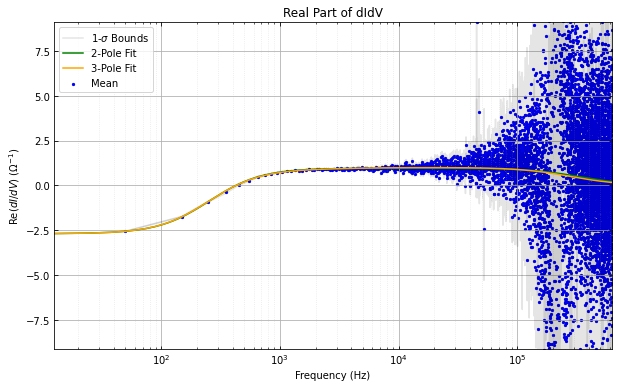

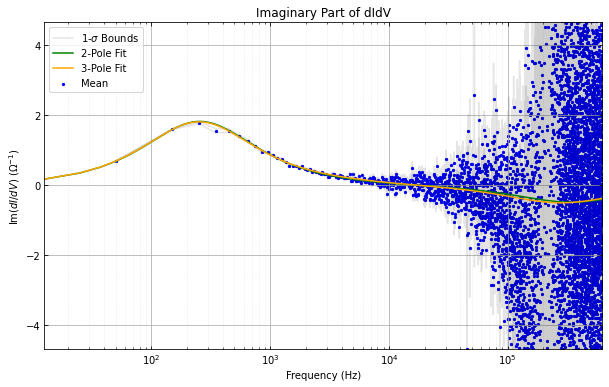



IrPtTESSmallV2 TES bias 9.966 uA, R0 = 263.97 mOhms (% Rn = 21.00)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.139

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000191 s
Tau2: 5.03e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 5.05e-07 s
Tau_minus: 0.000649 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 28.640 +/- 3.3016
beta = 2.876 +/- 0.0798
gratio = -0.000 +/- 0.0000
tau0 = 5.27 +/- 0.6288 ms
L = 518.723 +/- 43.3255 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.139

Fit time constants, NOT dIdV Poles: 
Tau1: 0.359 s
Tau2: 5.93e-07 s
Tau3: 4.926e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 5.96e

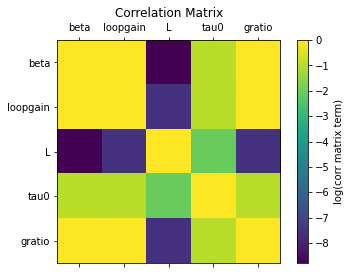

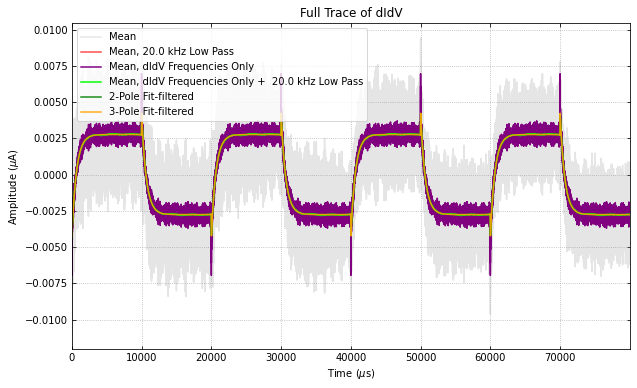

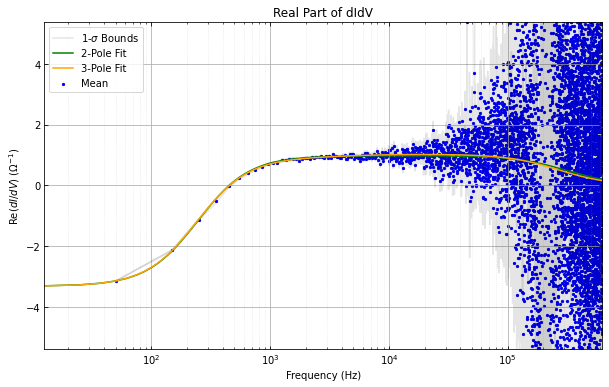

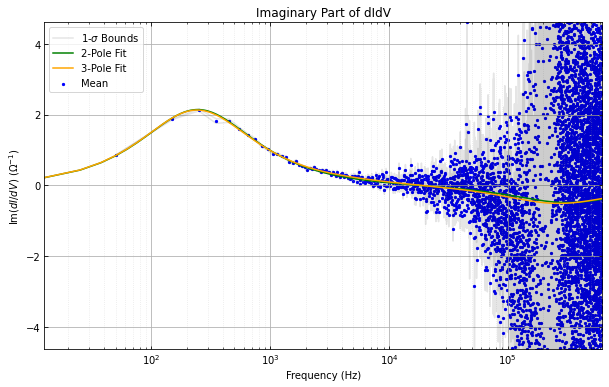



IrPtTESSmallV2 TES bias 8.990 uA, R0 = 214.83 mOhms (% Rn = 17.10)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.135

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000163 s
Tau2: 3.89e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 3.9e-07 s
Tau_minus: 0.000678 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 32.984 +/- 3.7739
beta = 3.702 +/- 0.0975
gratio = -0.000 +/- 0.0000
tau0 = 5.22 +/- 0.6159 ms
L = 396.391 +/- 40.6519 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.135

Fit time constants, NOT dIdV Poles: 
Tau1: 21.4 s
Tau2: 4.85e-07 s
Tau3: 4.604e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 4.88e-0

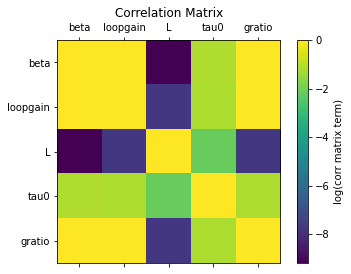

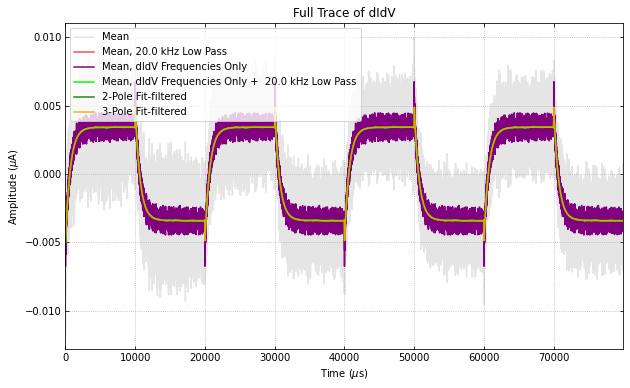

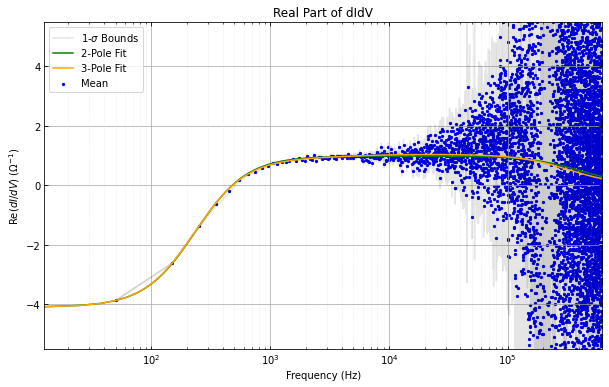

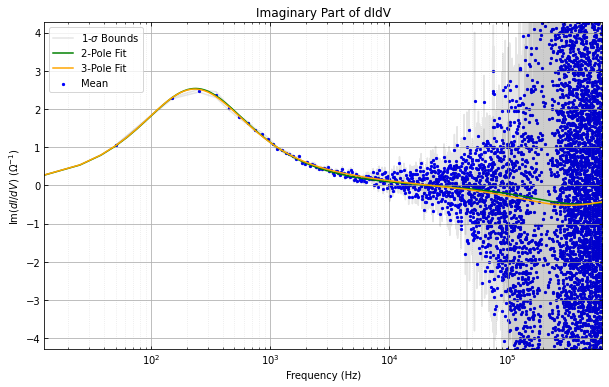



IrPtTESSmallV2 TES bias 8.013 uA, R0 = 170.05 mOhms (% Rn = 13.60)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.137

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000143 s
Tau2: 5.27e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 5.29e-07 s
Tau_minus: 0.000719 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 35.900 +/- 3.8236
beta = 4.710 +/- 0.1189
gratio = -0.000 +/- 0.0000
tau0 = 4.99 +/- 0.5469 ms
L = 516.026 +/- 42.9338 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.143

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000246 s
Tau2: 3.73e-07 s
Tau3: 6.157e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 3.

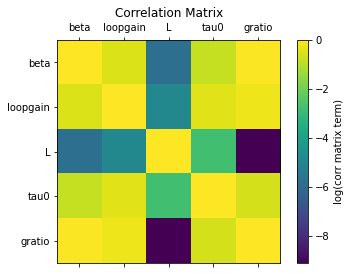

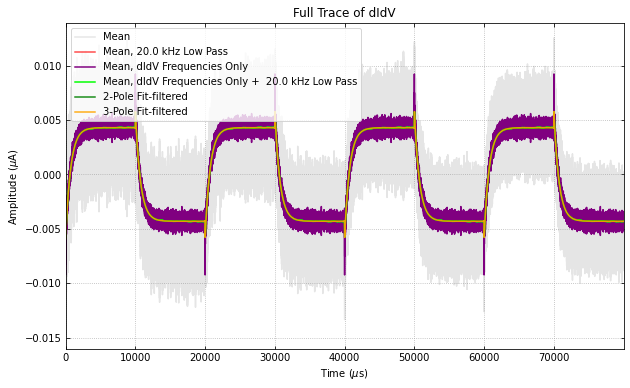

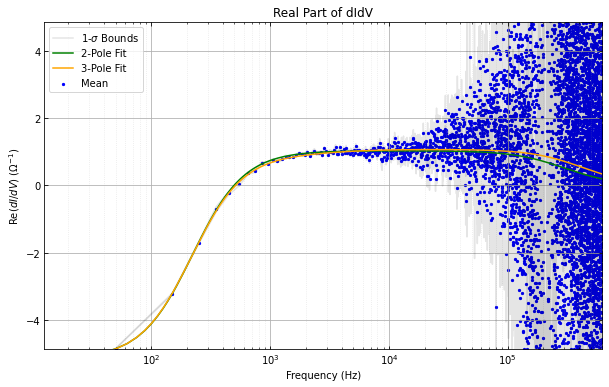

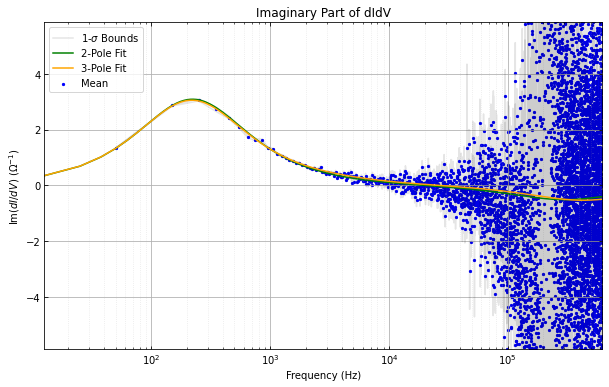



IrPtTESSmallV2 TES bias 7.036 uA, R0 = 129.82 mOhms (% Rn = 10.40)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.135

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000121 s
Tau2: 2.3e-14 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 2.3e-14 s
Tau_minus: 0.000772 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 40.834 +/- 4.1000
beta = 6.177 +/- 0.1514
gratio = -0.000 +/- 0.0000
tau0 = 4.83 +/- 0.4972 ms
L = 0.000 +/- 179.3772 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.134

Fit time constants, NOT dIdV Poles: 
Tau1: 0.194 s
Tau2: 1.03e-07 s
Tau3: 3.141e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 1.03e-07

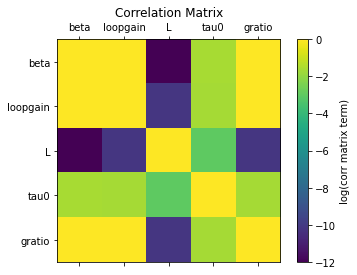

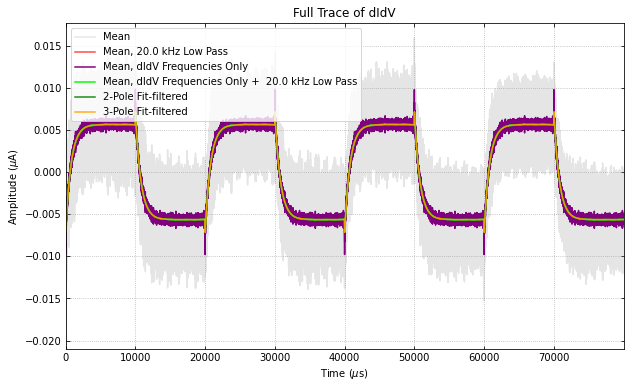

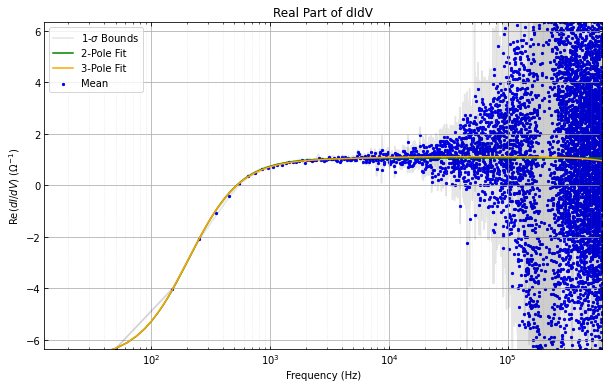

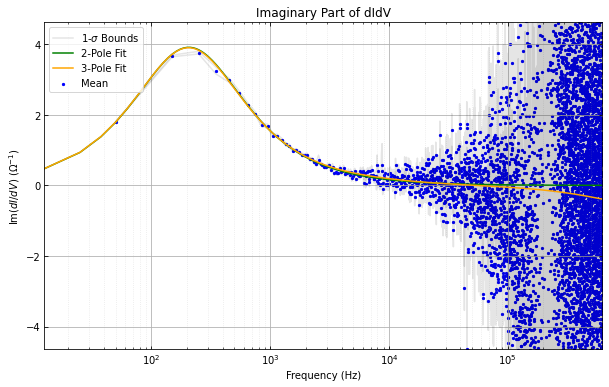



IrPtTESSmallV2 TES bias 5.978 uA, R0 = 91.50 mOhms (% Rn = 7.30)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.146

Fit time constants, NOT dIdV Poles: 
Tau1: 9.89e-05 s
Tau2: 3.55e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 3.56e-07 s
Tau_minus: 0.000867 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 53.764 +/- 5.5564
beta = 8.644 +/- 0.2066
gratio = -0.000 +/- 0.0000
tau0 = 5.22 +/- 0.5492 ms
L = 316.138 +/- 30.8724 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.145

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000153 s
Tau2: 3.85e-07 s
Tau3: 5.314e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 3.87

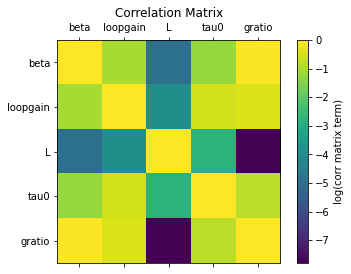

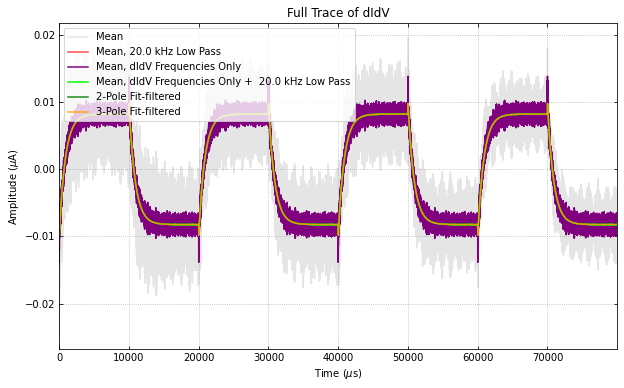

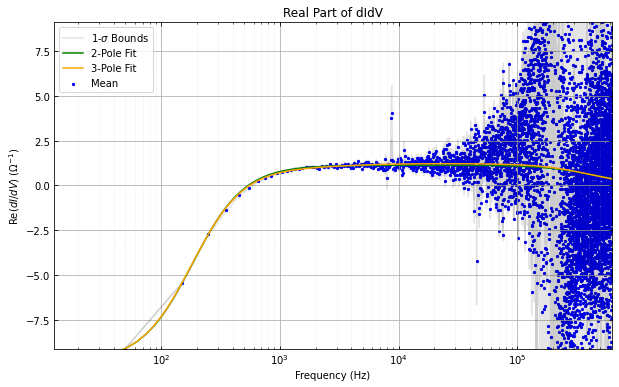

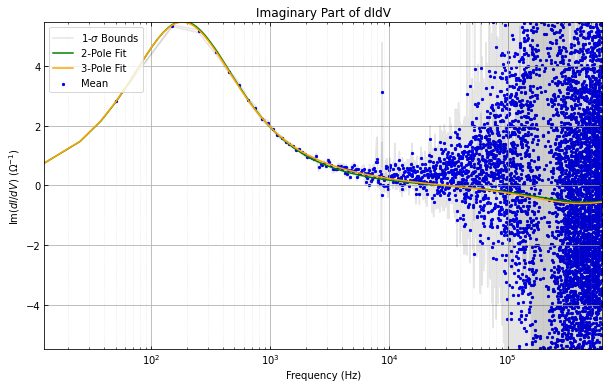

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231121_T155358/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


In [14]:
ivanalysis.analyze_didv(lgc_plot=True)

## Note: for those new to the IV/dIdV analysis 

When conducting an IV analysis, you will most likely be running it off of a demo. The demos are very helpful, but the ultimate demo which includes the theory behind all of these plots is still being developed. 

I made slides a good while ago to help students get started on the IV sweep and analysis in general, which would be helpful to review and study. 

When going down the analysis pipeline here, it is a good idea to stop and look at each plot and ask a few questions such as:

* Why does sigma (standard error) increase with increasing frequency? 
* Why are there a bunch more mean points at increasing frequency compared to lower frequency? 
* What is the connection between the time domain plots and the frequency domain plots? Can I think in frequency space easily? 
* What does the correlation matrix tell me? 
* How do the small signal parameters effect the device, and how our plots look? 



## Big


IrPtTESBigV2 SC dIdV analysis


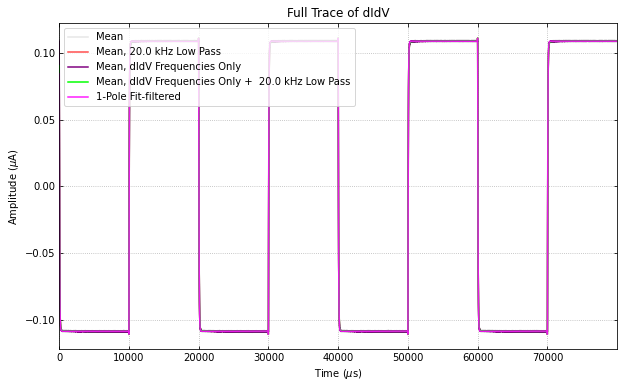

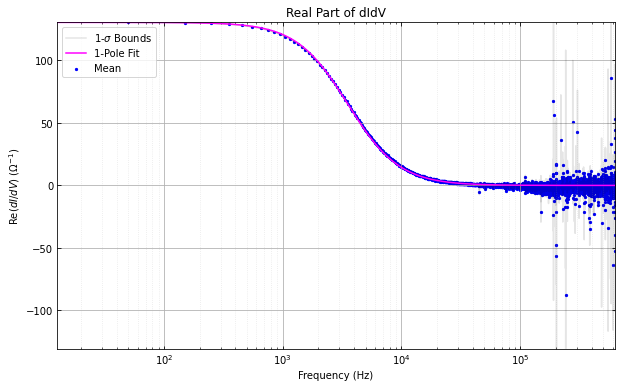

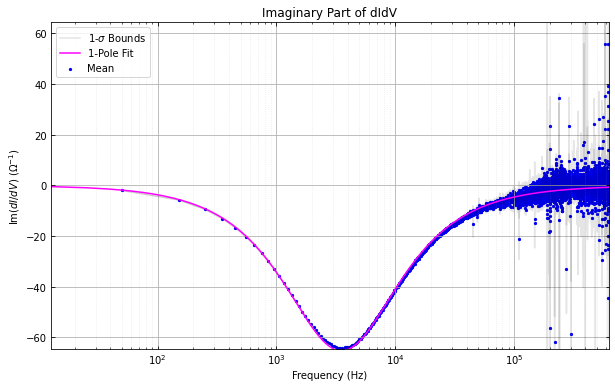

IrPtTESBigV2 Rp from dIdV fit = 2.67 +/- 0.004 mOhms
IrPtTESBigV2 Rp from IV Sweep = 2.64 +/- 0.053 mOhms
INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231122_T100201/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)

IrPtTESBigV2 Normal dIdV analysis


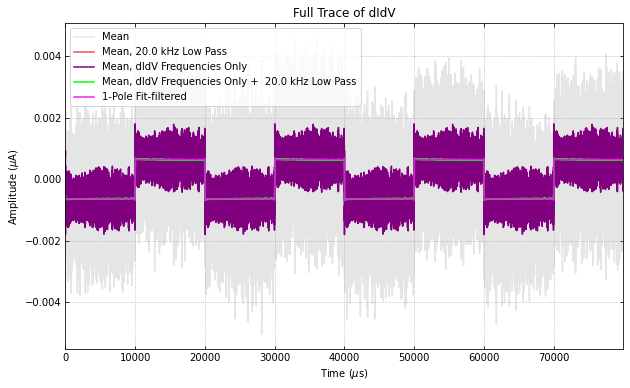

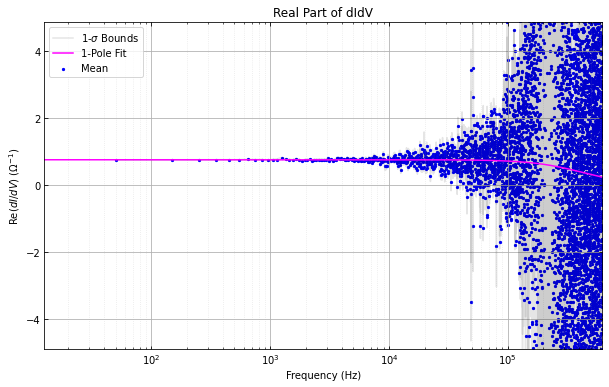

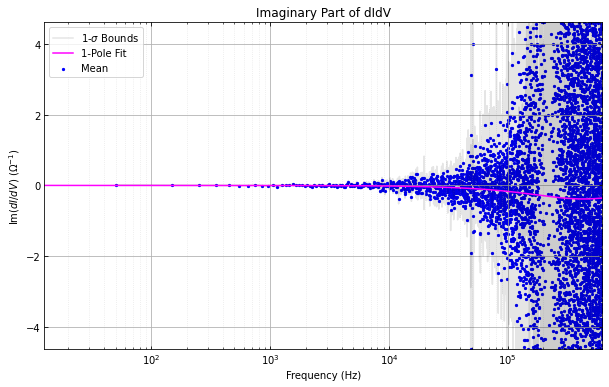

IrPtTESBigV2 Rn from dIdV fit = 1279.13 +/- 12.014 mOhms
IrPtTESBigV2 Rn from IV Sweep = 1320.85 +/- 26.570 mOhms
INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231122_T100201/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)

IrPtTESBigV2 Transition dIdV analysis


IrPtTESBigV2 TES bias 89.982 uA, R0 = 920.64 mOhms (% Rn = 69.70)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.129

Fit time constants, NOT dIdV Poles: 
Tau1: 0.00118 s
Tau2: 1.31e-06 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 1.32e-06 s
Tau_minus: 0.0011 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 6.050 +/- 0.2618
beta = 0.361 +/- 0.0274
gratio

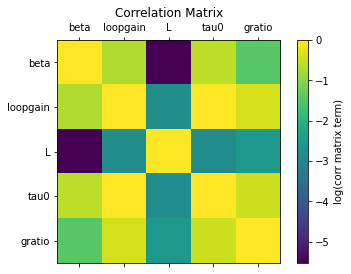

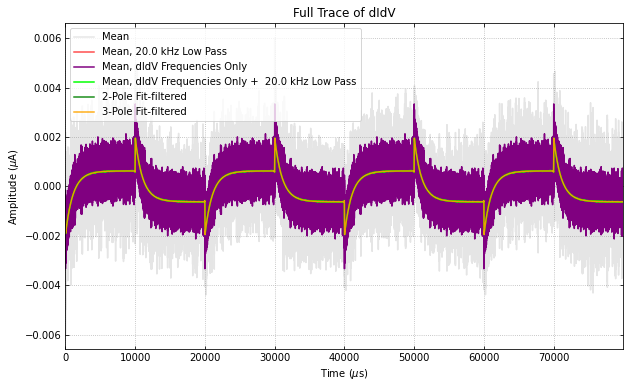

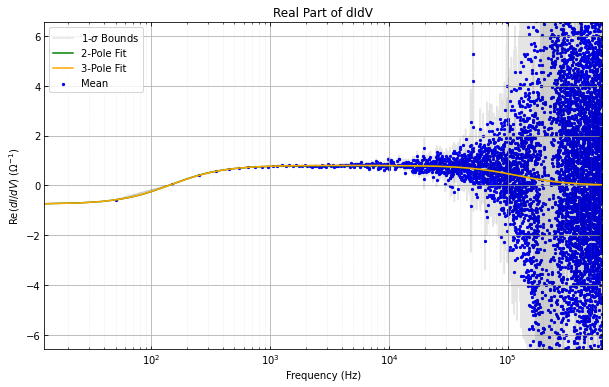

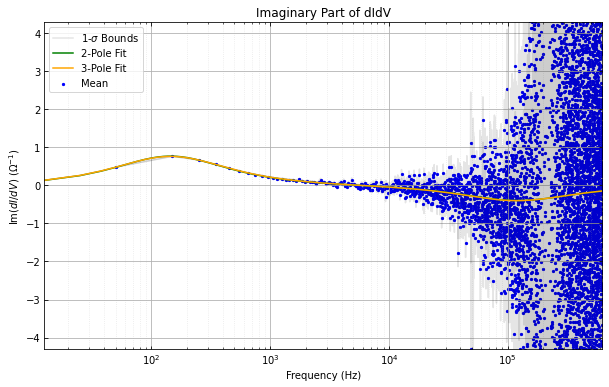



IrPtTESBigV2 TES bias 79.970 uA, R0 = 749.09 mOhms (% Rn = 56.70)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.130

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000785 s
Tau2: 1.12e-06 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 1.12e-06 s
Tau_minus: 0.001 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 8.916 +/- 0.5271
beta = 0.697 +/- 0.0342
gratio = -0.000 +/- 0.0000
tau0 = 6.21 +/- 0.413 ms
L = 1433.861 +/- 94.4256 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.129

Fit time constants, NOT dIdV Poles: 
Tau1: 0.00278 s
Tau2: 1.19e-06 s
Tau3: 0.0001341 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 1.19e-06

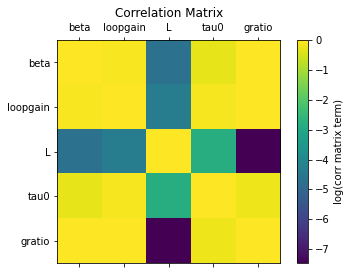

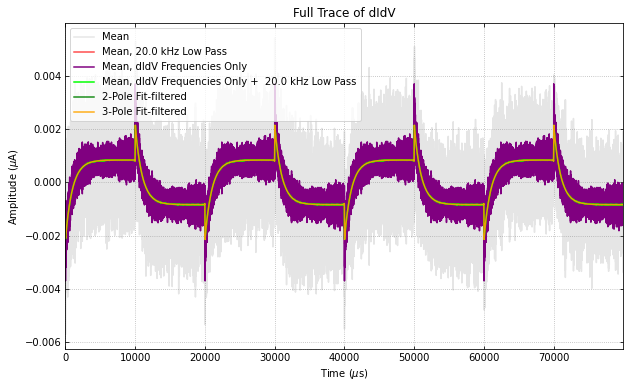

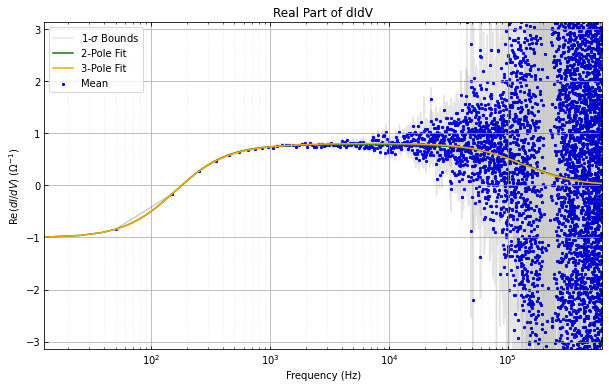

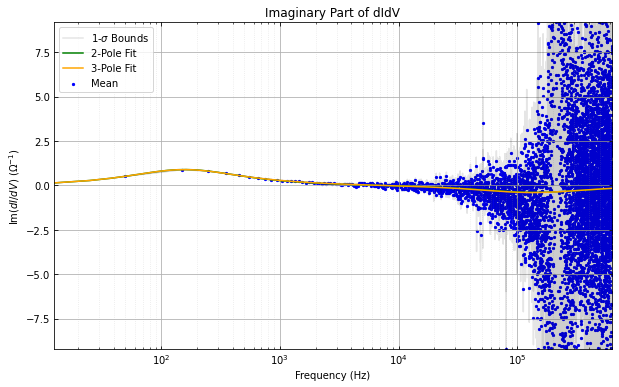



IrPtTESBigV2 TES bias 70.039 uA, R0 = 586.63 mOhms (% Rn = 44.40)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.128

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000385 s
Tau2: 1.04e-06 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 1.05e-06 s
Tau_minus: 0.000655 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 19.179 +/- 2.3771
beta = 0.951 +/- 0.0395
gratio = -0.000 +/- 0.0000
tau0 = 7 +/- 0.9143 ms
L = 1199.106 +/- 74.2617 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.127

Fit time constants, NOT dIdV Poles: 
Tau1: 0.14 s
Tau2: 1.17e-06 s
Tau3: 8.269e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 1.18e-06 

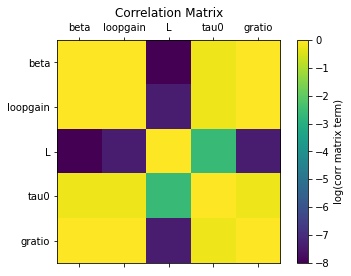

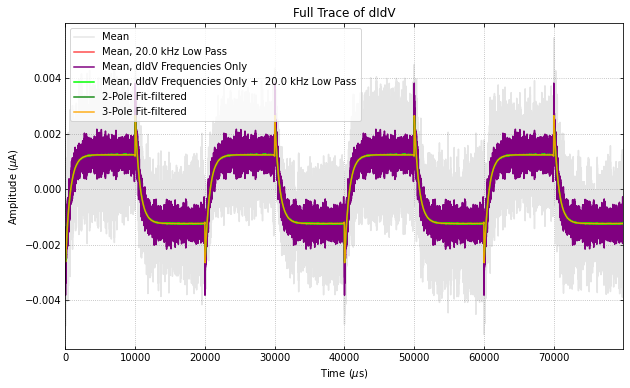

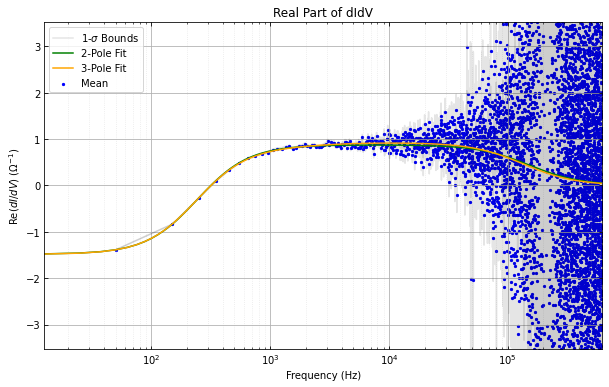

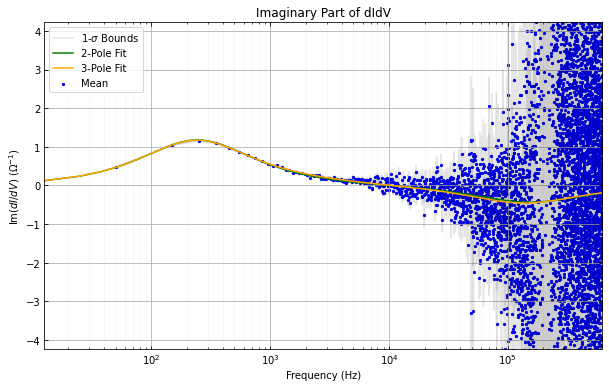



IrPtTESBigV2 TES bias 60.027 uA, R0 = 432.25 mOhms (% Rn = 32.70)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.137

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000168 s
Tau2: 1.38e-06 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 1.4e-06 s
Tau_minus: 0.000344 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 68.359 +/- 29.7903
beta = 1.112 +/- 0.0428
gratio = -0.000 +/- 0.0000
tau0 = 11.3 +/- 5.01 ms
L = 1271.701 +/- 48.0582 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.137

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000526 s
Tau2: 7.07e-07 s
Tau3: 5.301e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 7.12

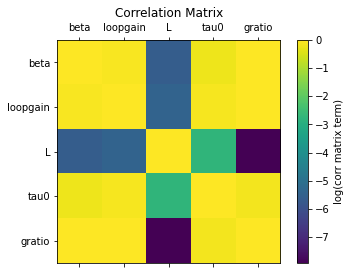

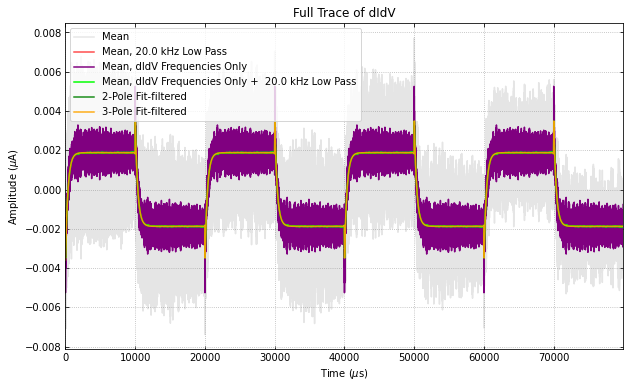

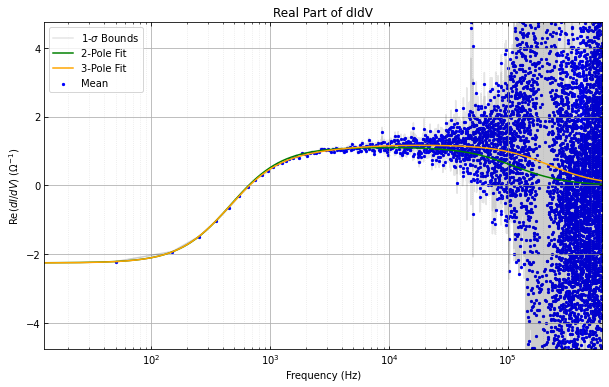

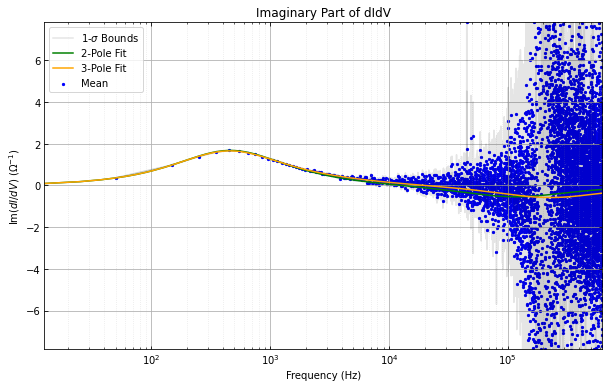



IrPtTESBigV2 TES bias 54.980 uA, R0 = 361.15 mOhms (% Rn = 27.30)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.133

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000135 s
Tau2: 1.44e-06 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 1.46e-06 s
Tau_minus: 0.0003 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 158.505 +/- 155.9094
beta = 1.227 +/- 0.0453
gratio = -0.000 +/- 0.0000
tau0 = 21.3 +/- 21.11 ms
L = 1165.658 +/- 48.3585 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.131

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000212 s
Tau2: 6.51e-07 s
Tau3: 5.473e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 6.

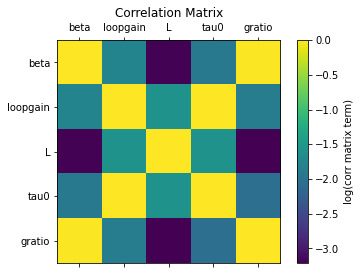

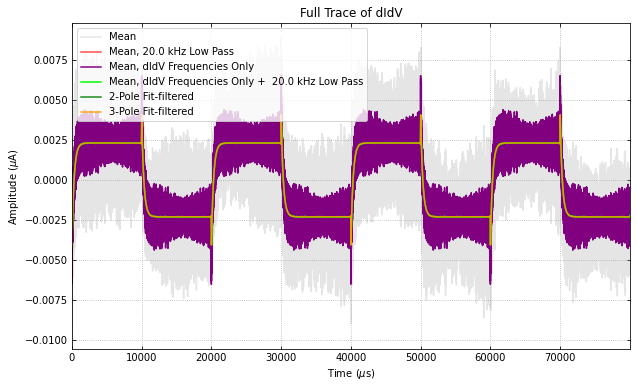

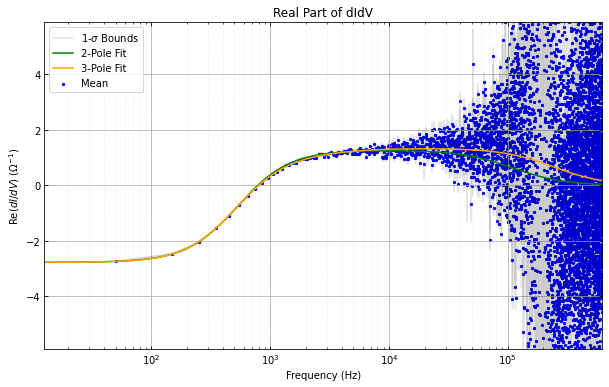

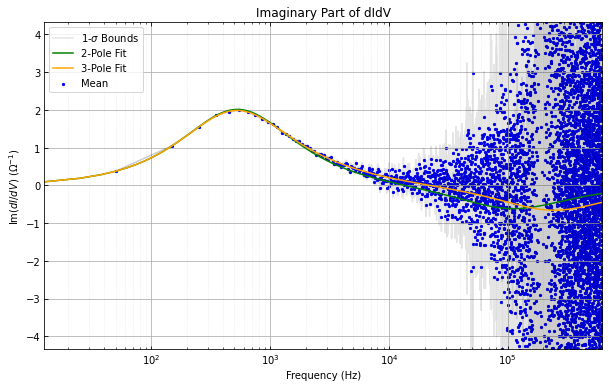



IrPtTESBigV2 TES bias 50.015 uA, R0 = 296.76 mOhms (% Rn = 22.50)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.135

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000126 s
Tau2: 6.18e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 6.22e-07 s
Tau_minus: 0.000293 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 225.119 +/- 310.2222
beta = 1.283 +/- 0.0475
gratio = -0.000 +/- 0.0000
tau0 = 28.3 +/- 39.14 ms
L = 423.544 +/- 44.4453 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.135

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000191 s
Tau2: 6.84e-07 s
Tau3: 5.063e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 6

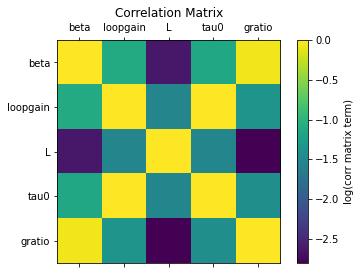

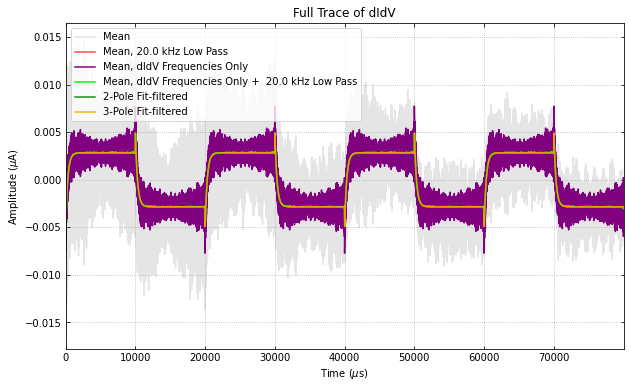

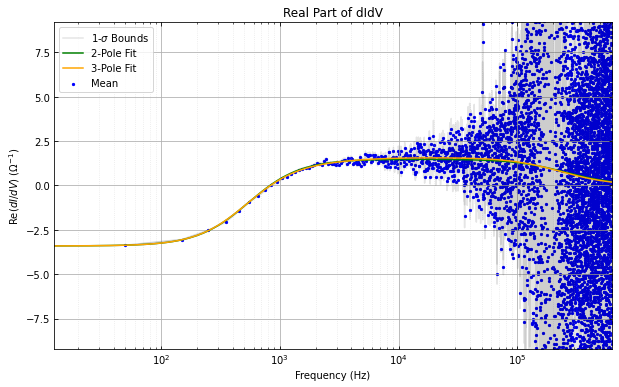

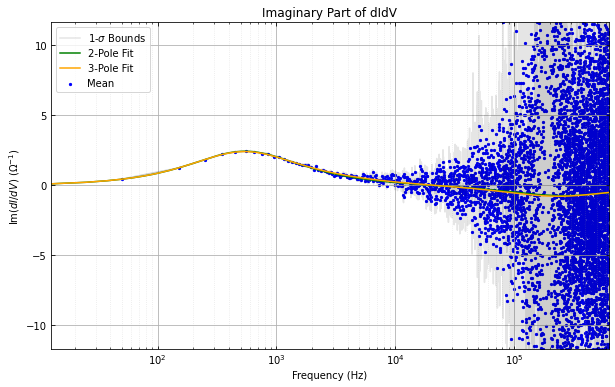



IrPtTESBigV2 TES bias 44.968 uA, R0 = 237.43 mOhms (% Rn = 18.00)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.143

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000139 s
Tau2: 7.59e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 7.65e-07 s
Tau_minus: 0.000311 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 100.043 +/- 62.1555
beta = 1.225 +/- 0.0453
gratio = -0.000 +/- 0.0000
tau0 = 13.8 +/- 8.636 ms
L = 406.924 +/- 17.3397 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.142

Fit time constants, NOT dIdV Poles: 
Tau1: 0.00018 s
Tau2: 8.15e-07 s
Tau3: 6.142e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 8.2

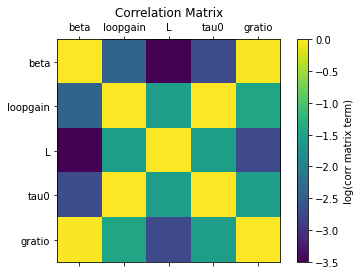

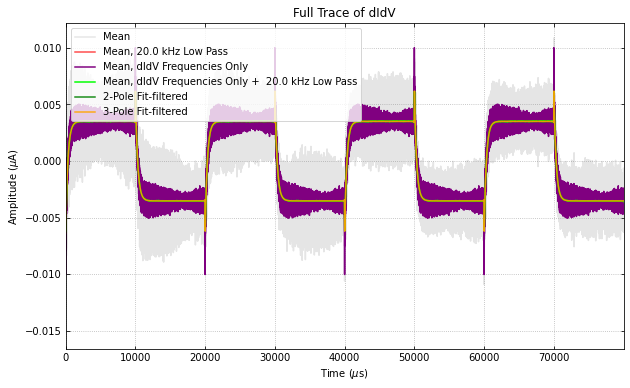

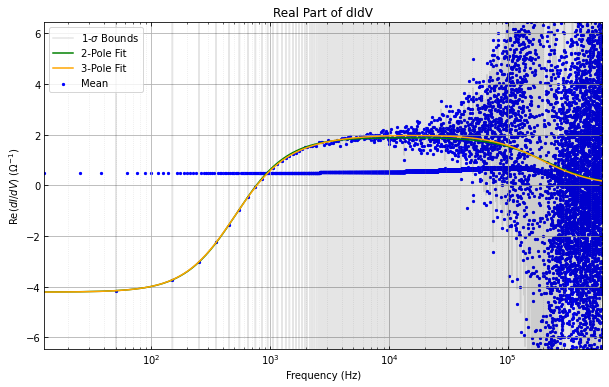

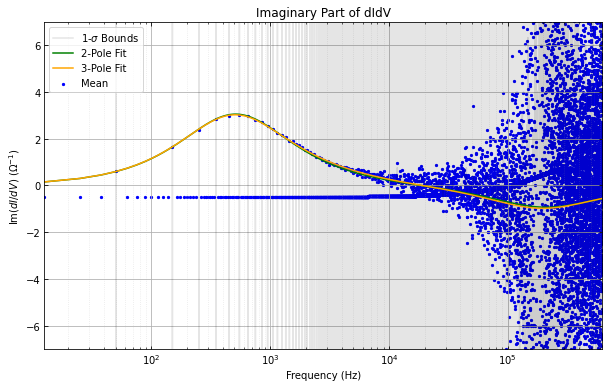



IrPtTESBigV2 TES bias 40.003 uA, R0 = 185.32 mOhms (% Rn = 14.00)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.140

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000155 s
Tau2: 8.52e-07 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 8.59e-07 s
Tau_minus: 0.000357 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 92.588 +/- 52.7130
beta = 1.264 +/- 0.0461
gratio = -0.000 +/- 0.0000
tau0 = 14.2 +/- 8.173 ms
L = 364.074 +/- 12.7543 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.138

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000209 s
Tau2: 9.17e-07 s
Tau3: 6.057e-05 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 9.2

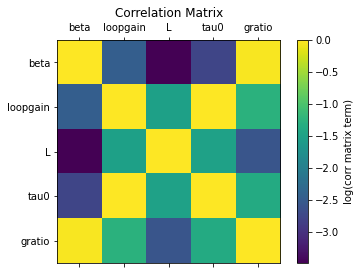

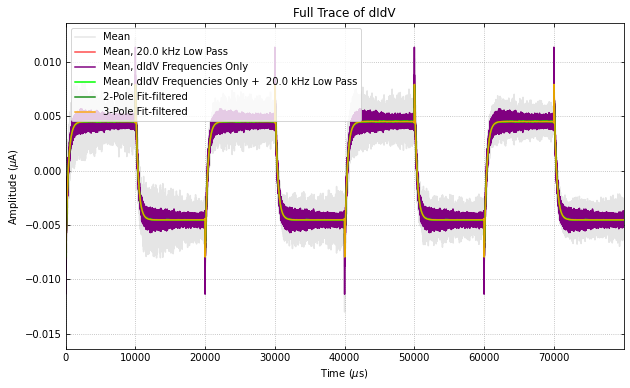

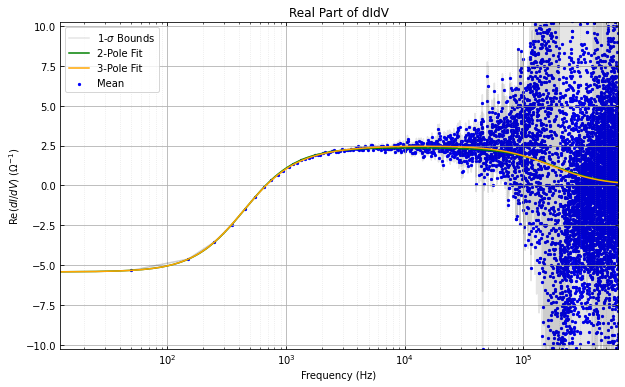

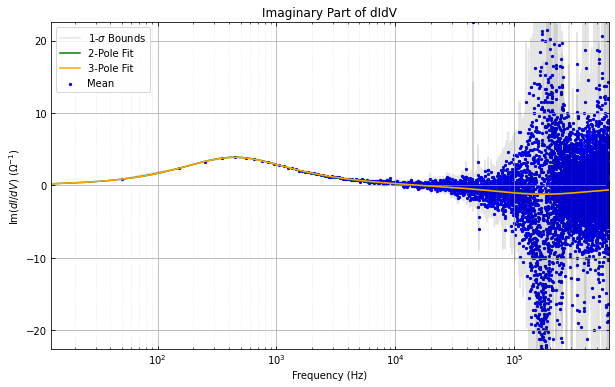



IrPtTESBigV2 TES bias 29.991 uA, R0 = 98.68 mOhms (% Rn = 7.50)

INFO: Fitting dIdV (2 and 3-poles)
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating TES bias parameters with infinite loop gain approximation
INFO: Calculating dPdI (2 and 3-poles)

Results from 2-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.135

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000213 s
Tau2: 1.23e-06 s
Tau3: 0 s

True dIdV Poles (from 2-poles fit): 
Tau_plus: 1.24e-06 s
Tau_minus: 0.000565 s
Tau_third: 0 s

Small Signal Parameters:
l (loop gain) = 56.665 +/- 18.1888
beta = 1.563 +/- 0.0528
gratio = -0.000 +/- 0.0000
tau0 = 11.9 +/- 3.874 ms
L = 320.999 +/- 8.7164 nH

Results from 3-poles dIdV fit
---------------------------------

Fit chi2/Ndof = 0.133

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000214 s
Tau2: 1.26e-06 s
Tau3: 0.000376 s

True dIdV Poles (from 3-poles fit): 
Tau_plus: 1.27e-0

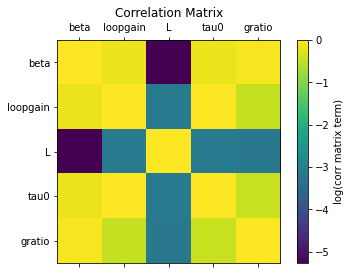

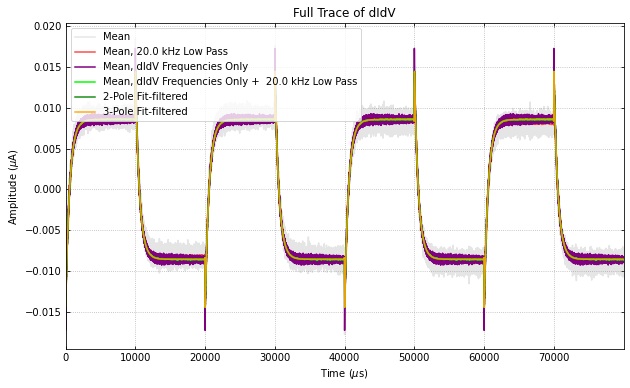

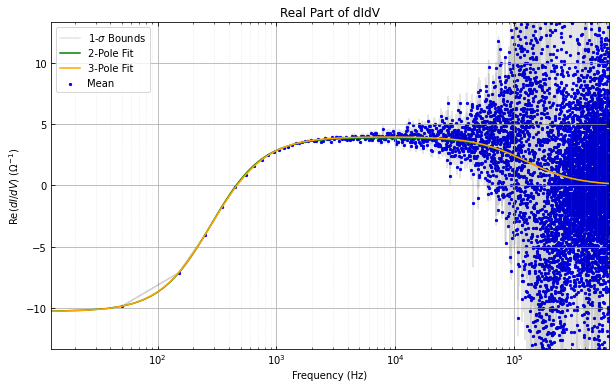

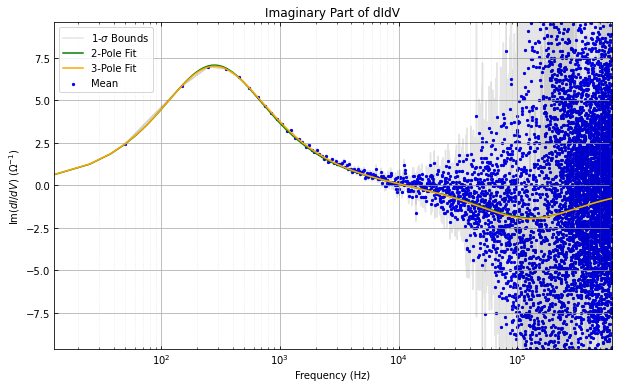

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231122_T100201/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


In [15]:
ivanalysis_big.analyze_didv(lgc_plot=True)

## Summary of results

Summary dIdV Analysis for IrPtTESSmallV2

TES Superconducting Measurements:

Rp from dIdV fit = 3.66 +/- 0.008 mOhms
Rp rom IV Sweep = 1254.24 +/- 25.257 mOhms

TES Normal Measurements:

Rn from dIdV fit = 1235.58 +/- 9.463 mOhms
Rn rom IV Sweep = 1254.24 +/- 25.257 mOhms

Measurements TES in Transition 3-poles Fit:


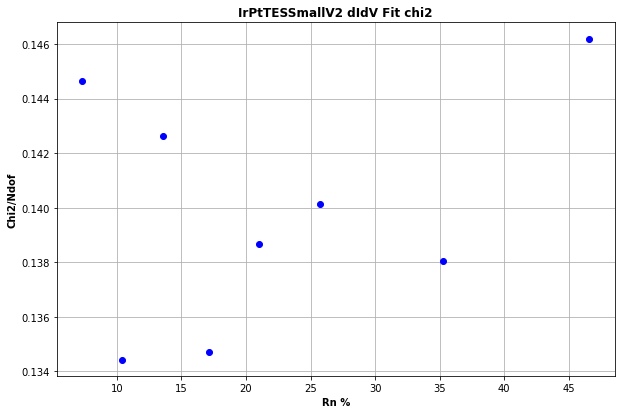


Small Signal Parameters


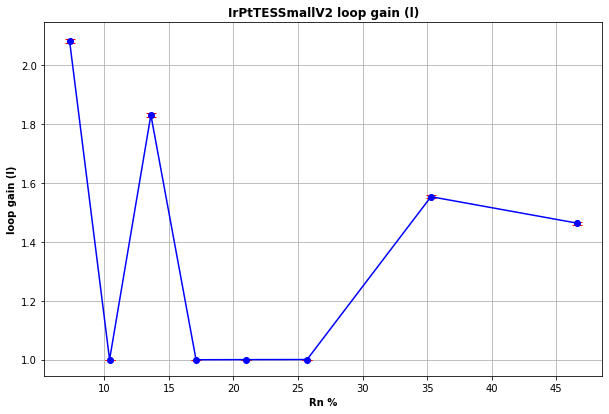

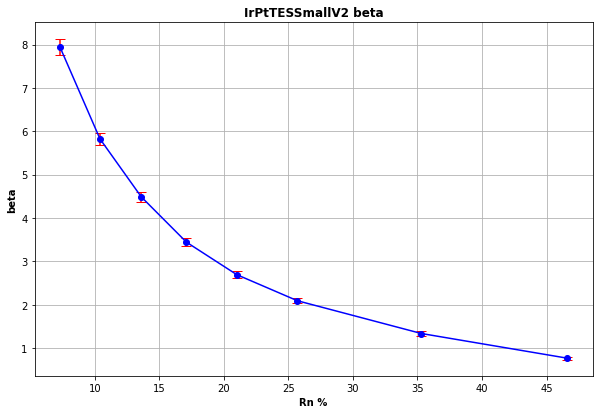

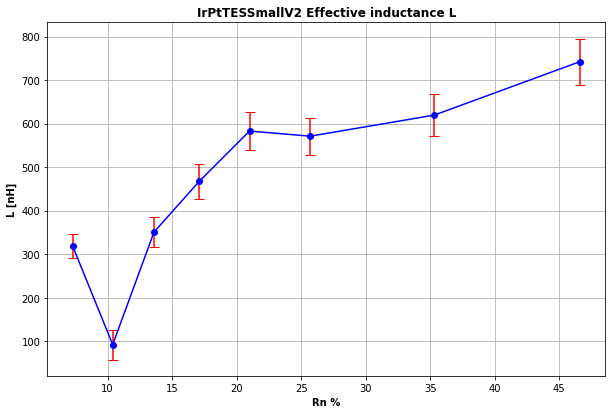

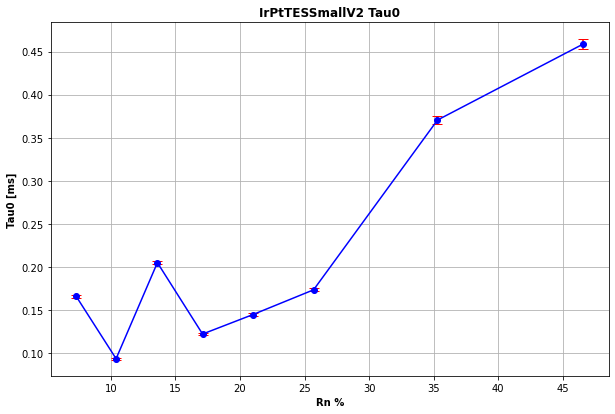

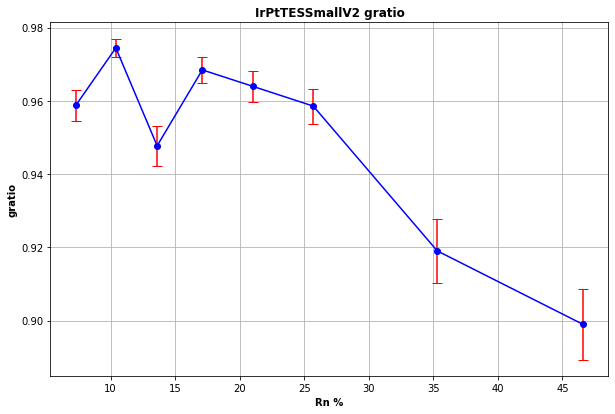


Fall Times


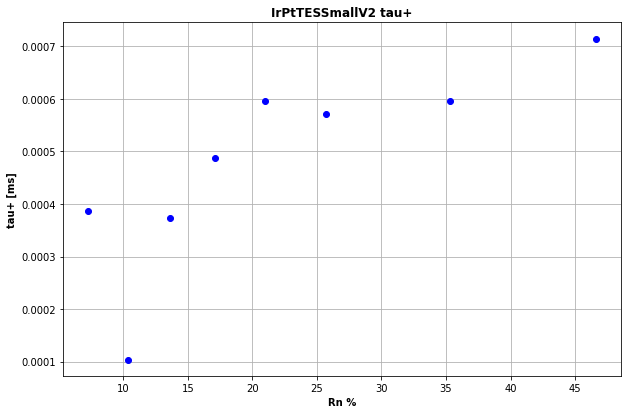

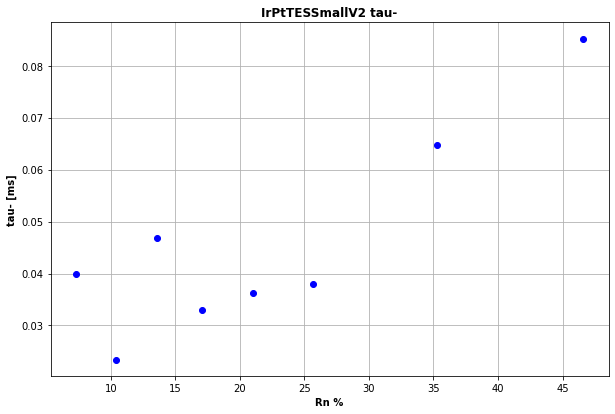

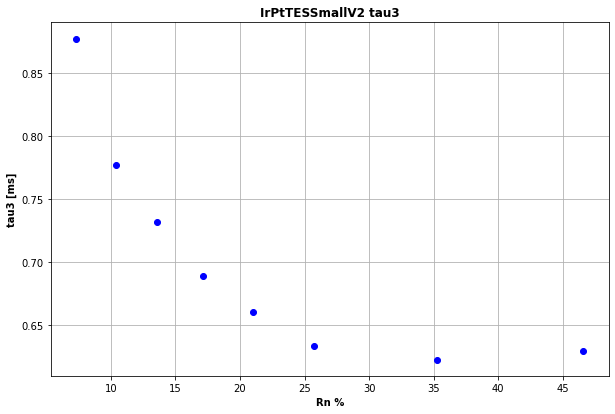

In [16]:
ivanalysis.plot_didv_summary('IrPtTESSmallV2')

Summary dIdV Analysis for IrPtTESBigV2

TES Superconducting Measurements:

Rp from dIdV fit = 2.67 +/- 0.004 mOhms
Rp rom IV Sweep = 1320.85 +/- 26.570 mOhms

TES Normal Measurements:

Rn from dIdV fit = 1279.13 +/- 12.014 mOhms
Rn rom IV Sweep = 1320.85 +/- 26.570 mOhms

Measurements TES in Transition 3-poles Fit:


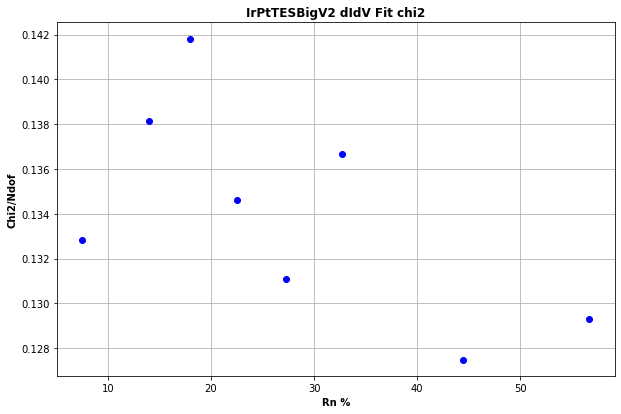


Small Signal Parameters


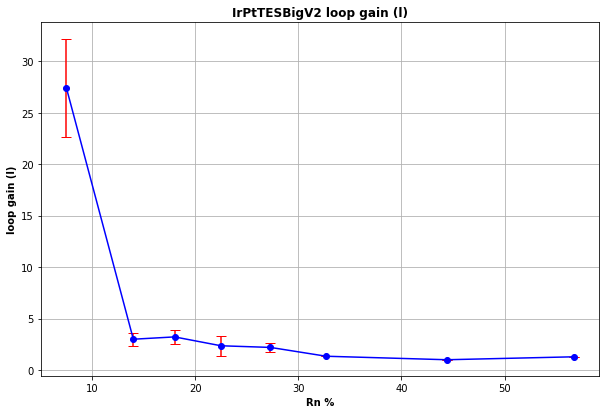

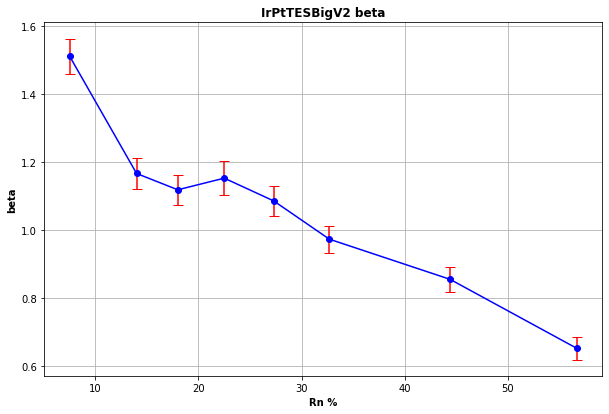

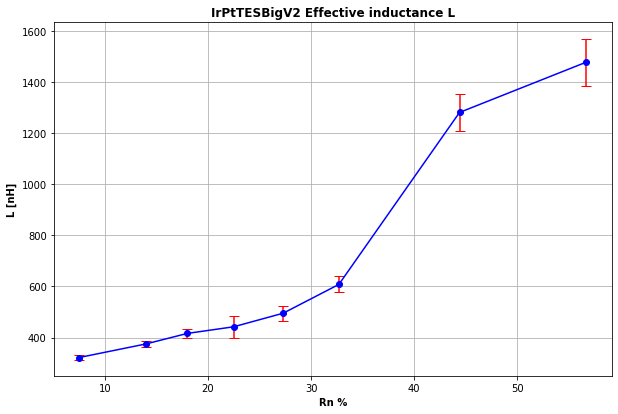

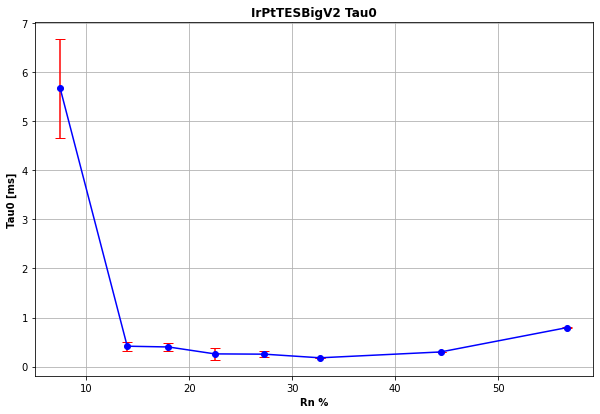

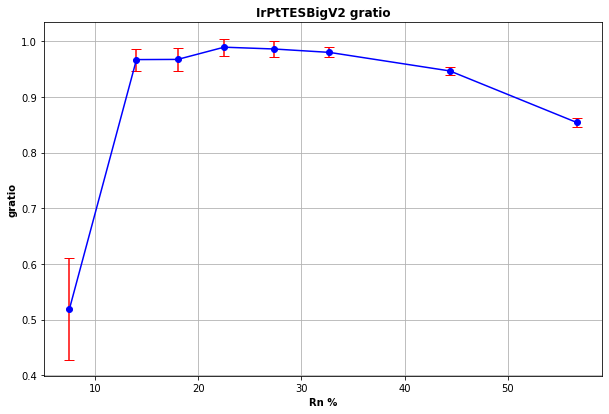


Fall Times


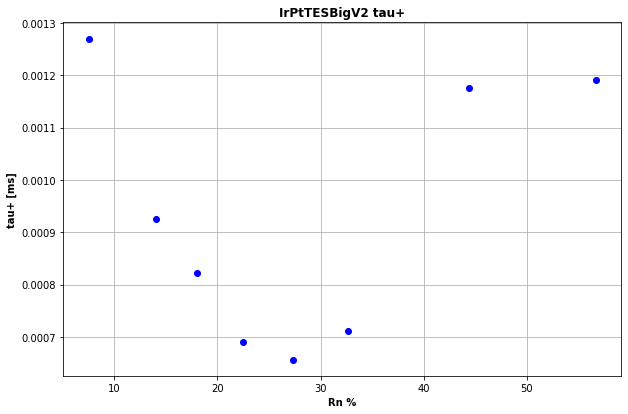

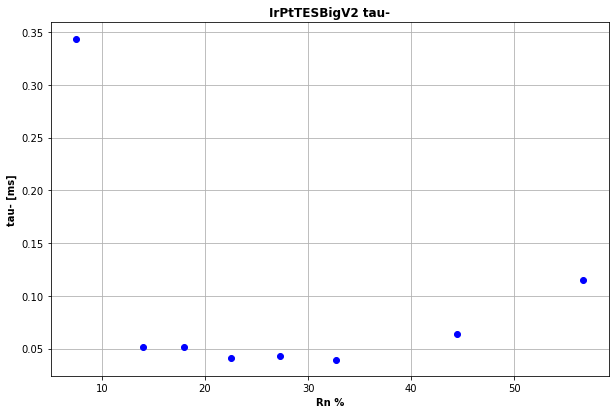

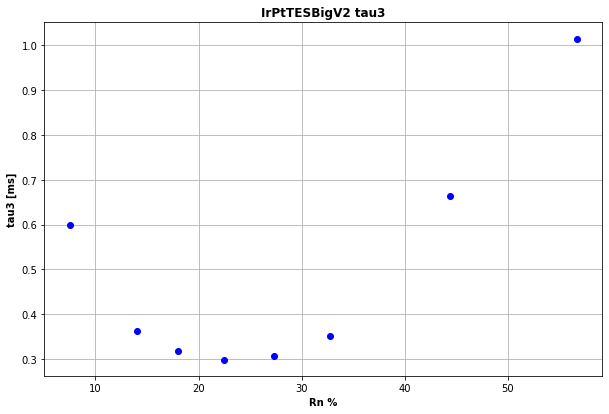

In [17]:
ivanalysis_big.plot_didv_summary('IrPtTESBigV2')

# Noise modeling

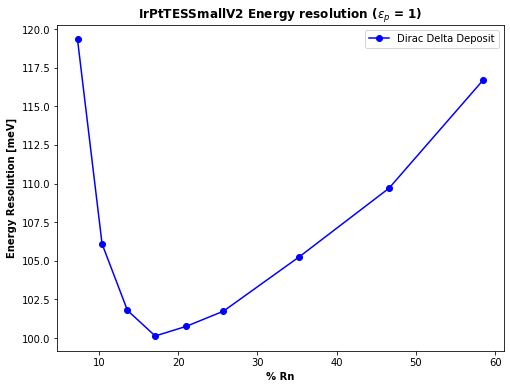

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231121_T155358/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


In [25]:
# if only direc delta power needed, then set argument 
# template=None
ivanalysis.calc_energy_resolution(channels='IrPtTESSmallV2', lgc_plot=True, template=None,
                                  collection_eff=1, poles=2)

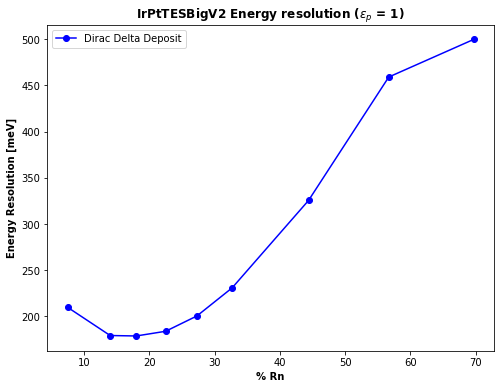

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231122_T100201/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


In [26]:
ivanalysis_big.calc_energy_resolution(channels='IrPtTESBigV2', lgc_plot=True, template=None,
                                  collection_eff=1, poles=2)

## Small IrPt

In [18]:
# Set Tc for each channel 
ivanalysis.set_tc('IrPtTESSmallV2', 44.5e-3)

# SEt Tbath
ivanalysis.set_tbath(15e-3)

# Set Tload guess
ivanalysis.set_tload_guess(70e-3)

### 2pole noise modeling


INFO: Calculating IrPtTESSmallV2 SQUID noise from normal noise
INFO: Performing IrPtTESSmallV2 SC Noise Fit
INFO: Channel IrPtTESSmallV2 Tload from SC Fit: 70.81 mK

INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 16.967 uA (58.5% Rn)


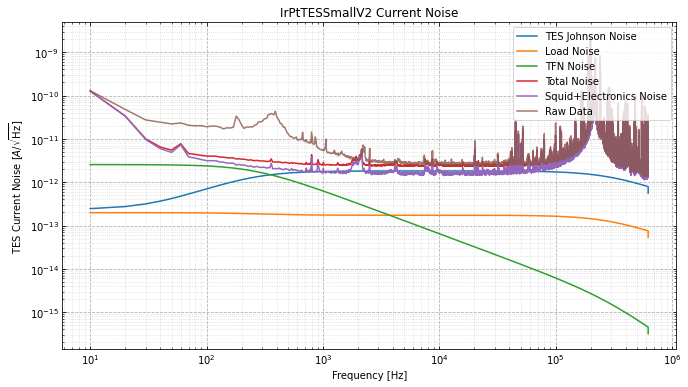

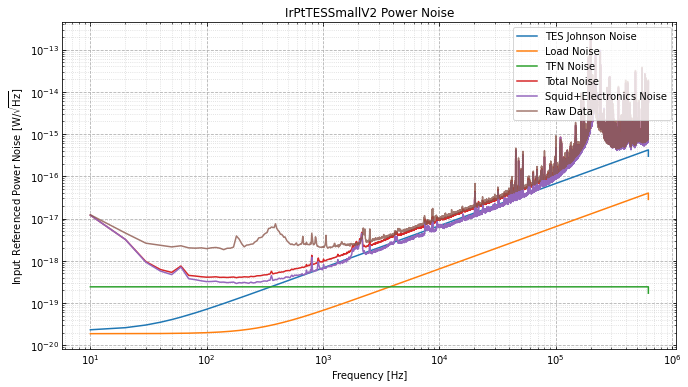


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 15.013 uA (46.6% Rn)


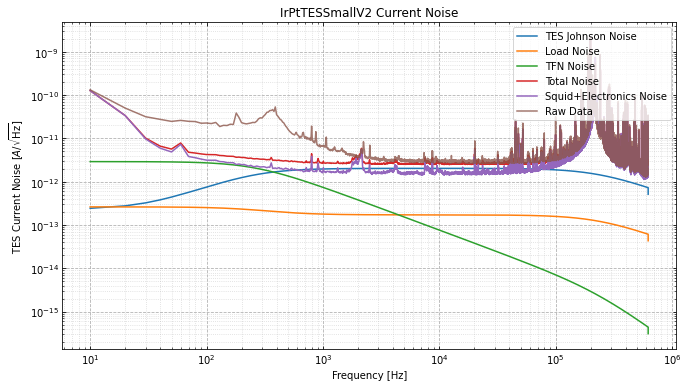

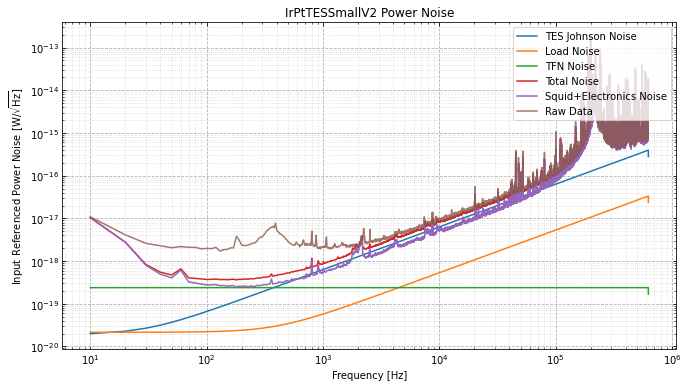


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 12.978 uA (35.3% Rn)


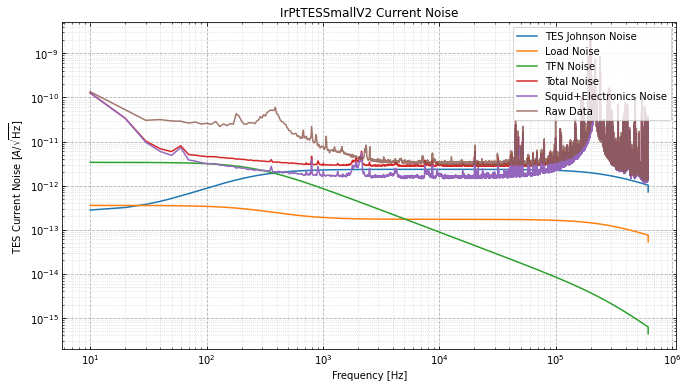

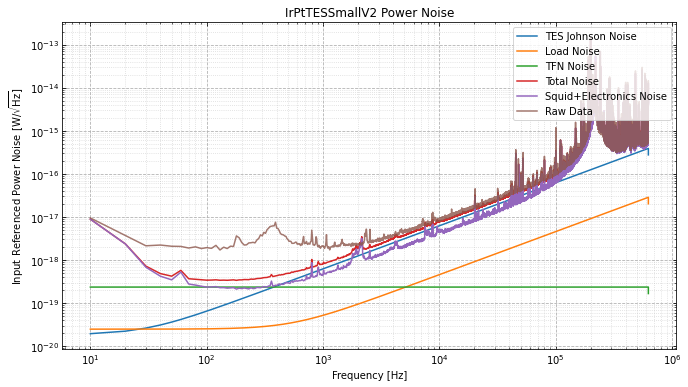


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 11.025 uA (25.7% Rn)


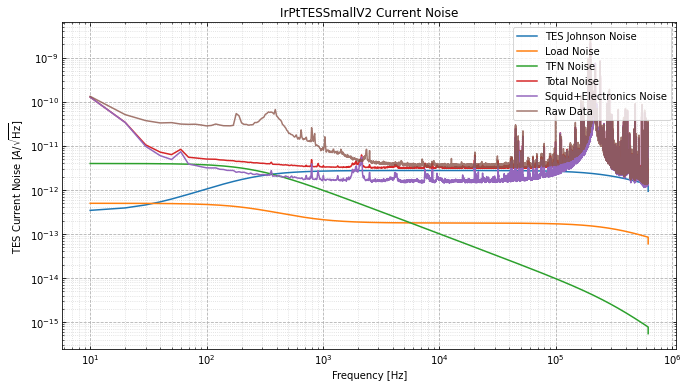

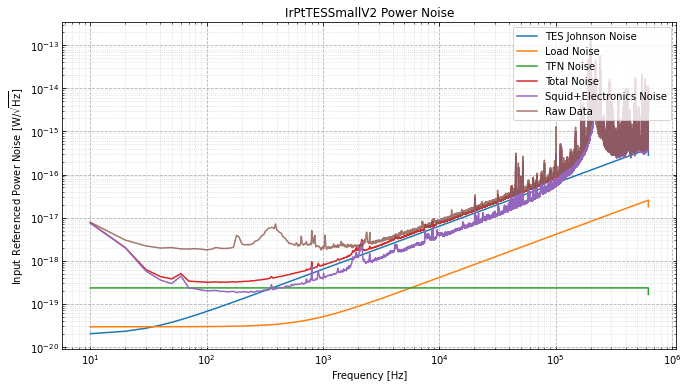


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 9.966 uA (21.0% Rn)


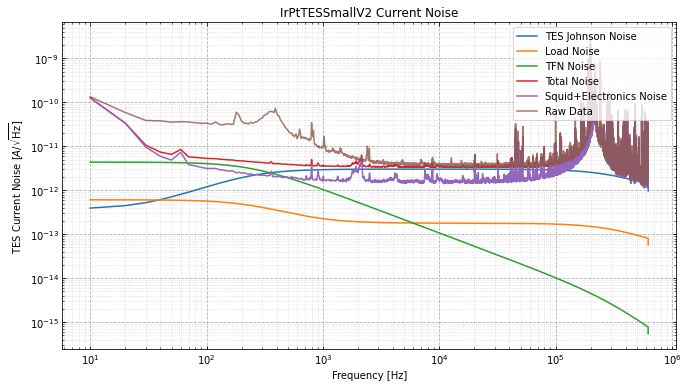

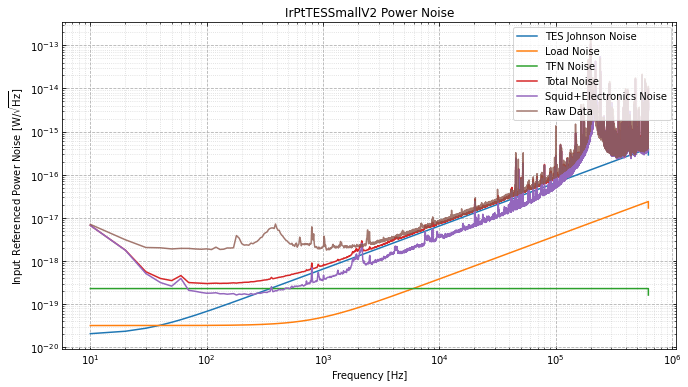


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 8.99 uA (17.1% Rn)


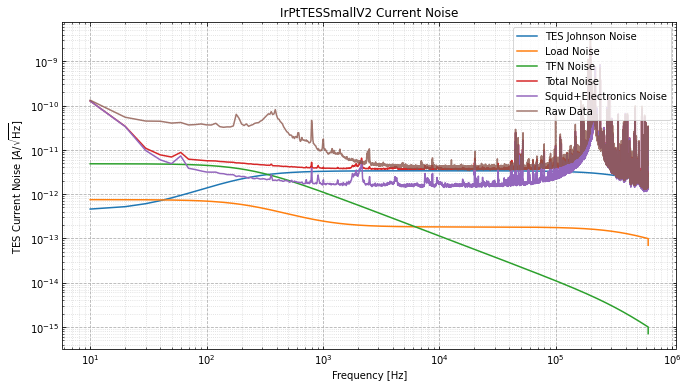

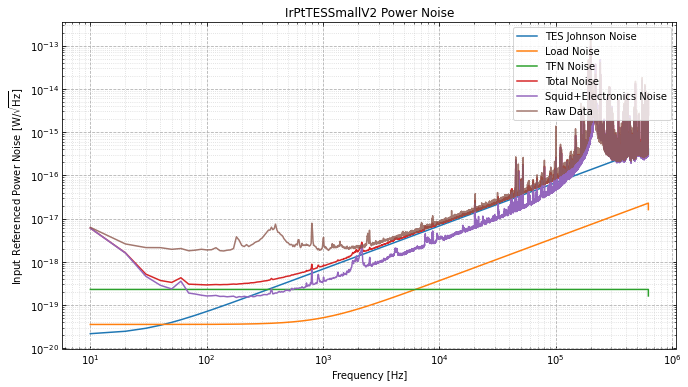


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 8.013 uA (13.6% Rn)


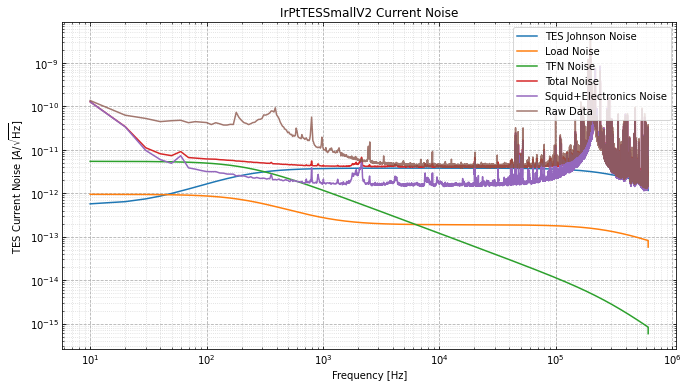

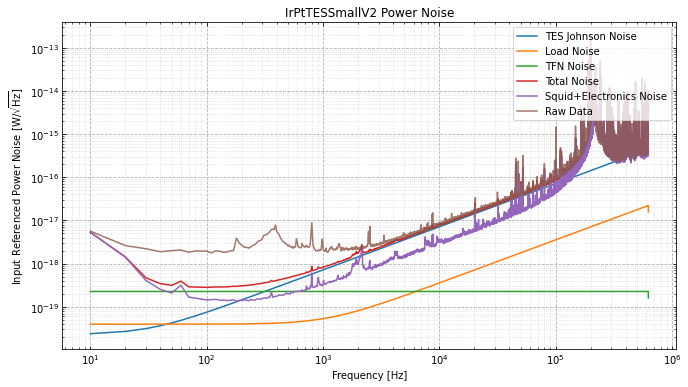


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 7.036 uA (10.4% Rn)


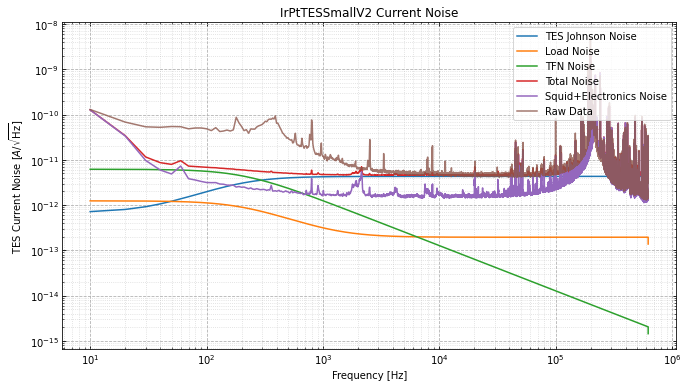

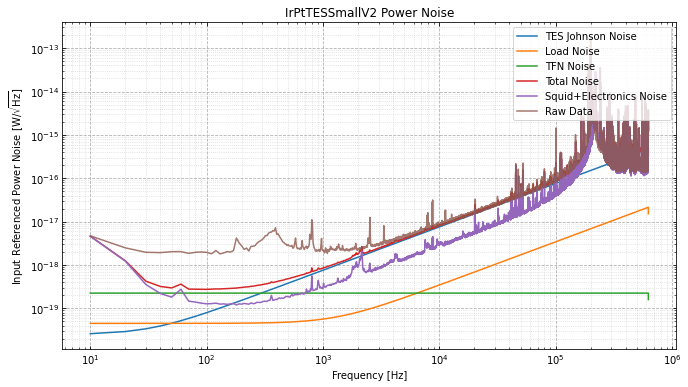


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 5.978 uA (7.3% Rn)


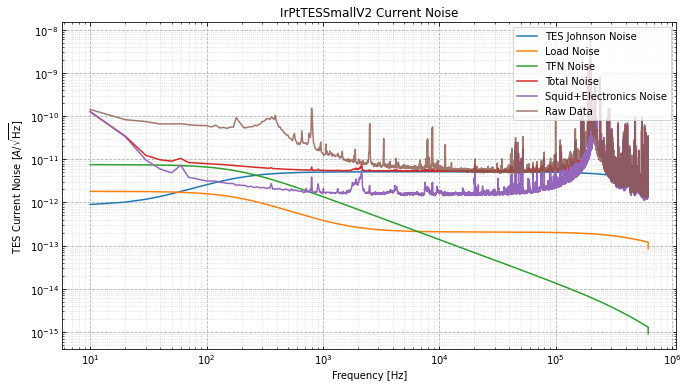

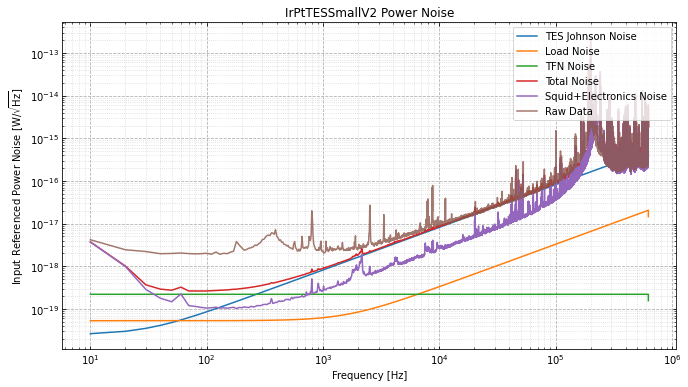

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231121_T155358/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


In [20]:
ivanalysis.analyze_noise(fit_range=(100, 1e5), poles=2, lgc_plot=True)

### 3 pole noise modeling

The 3 pole dIdV transition fits seem to be fitting the 3rd pole to tau_-. You can see this above looking at the small device's pole fits at 11 uA. 

In the 3 pole fit, tau_- is 4e-5 seconds, while the 3rd pole is 6e-4, almost precisely the same as tau_- in the two pole fit. 

That aside, we can check that the two pole fit is correct, and we don't have some strange fitting errors that result in an actual 3 pole model being the best one for the devices, by looking at the power noise of the device. Both 2 and 3 pole should have the same power noise models roughly. 


INFO: Calculating IrPtTESSmallV2 SQUID noise from normal noise
INFO: Performing IrPtTESSmallV2 SC Noise Fit
INFO: Channel IrPtTESSmallV2 Tload from SC Fit: 70.81 mK

INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 16.967 uA (58.5% Rn)


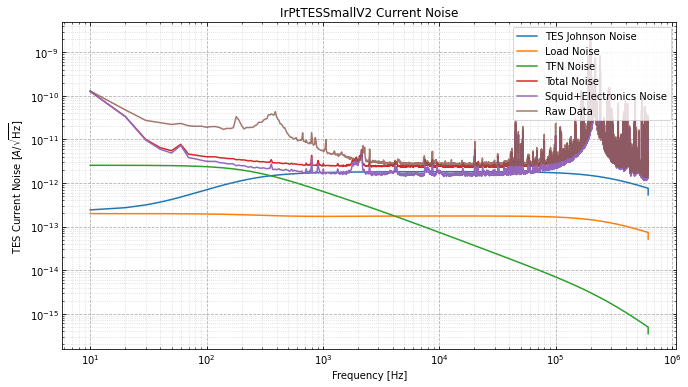

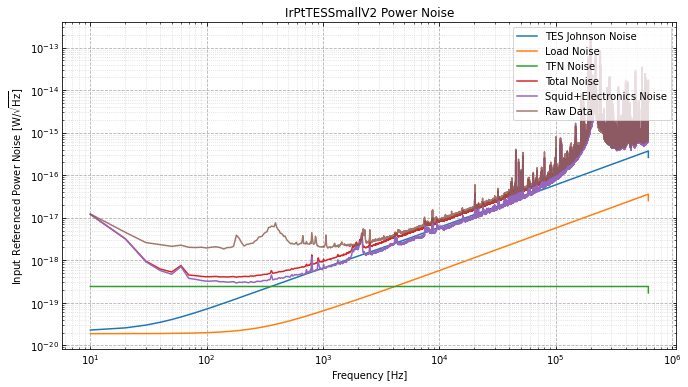


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 15.013 uA (46.6% Rn)


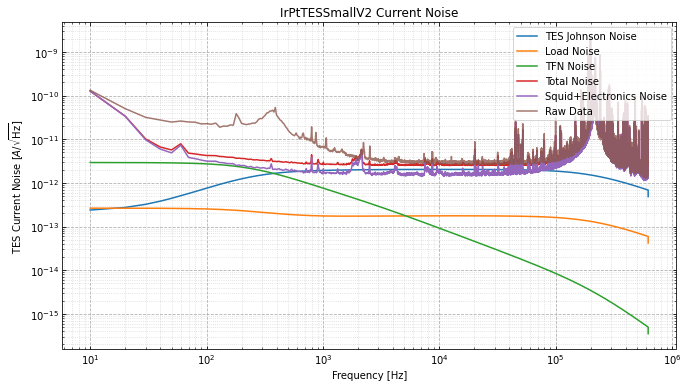

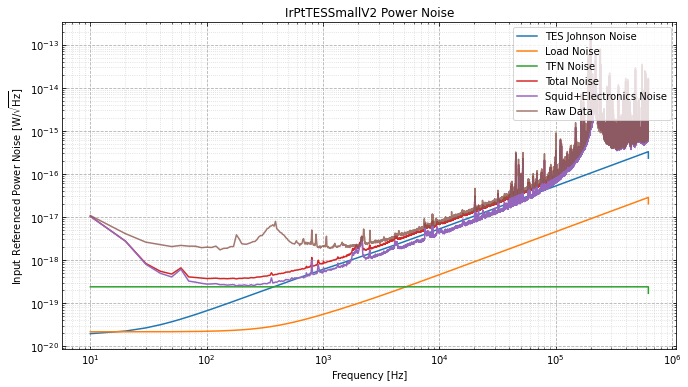


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 12.978 uA (35.3% Rn)


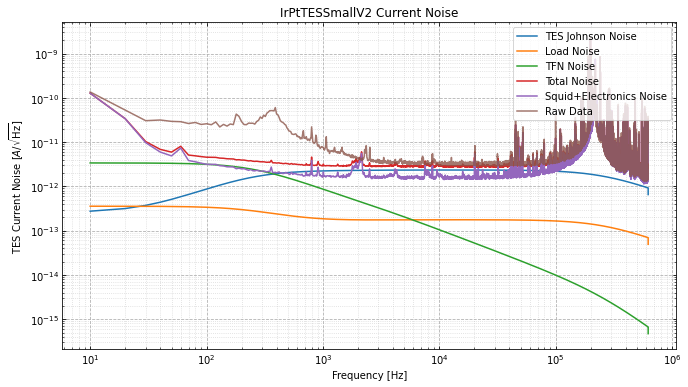

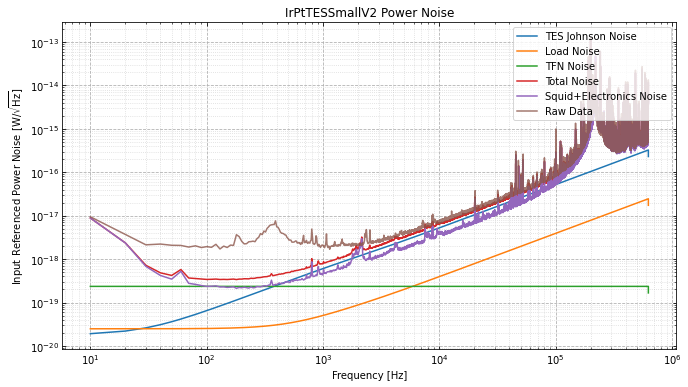


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 11.025 uA (25.7% Rn)


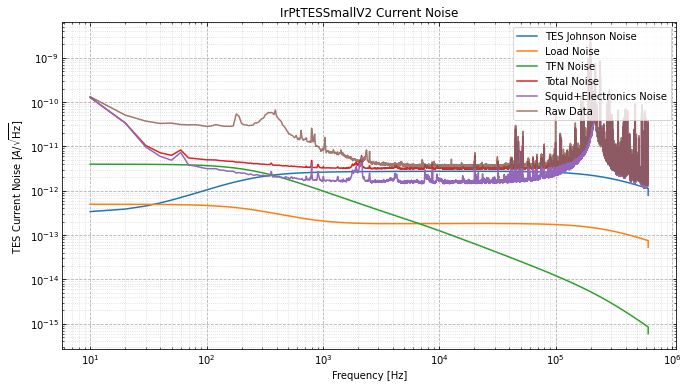

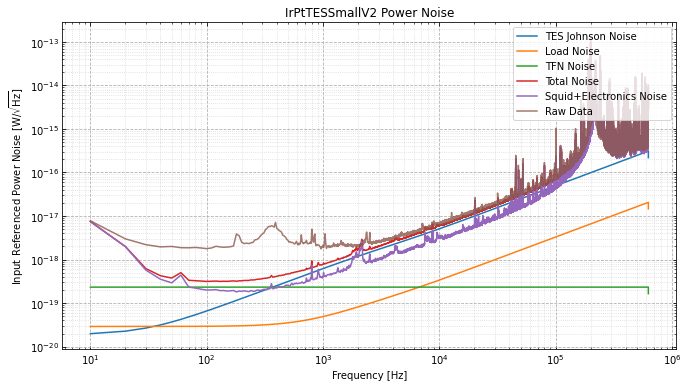


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 9.966 uA (21.0% Rn)


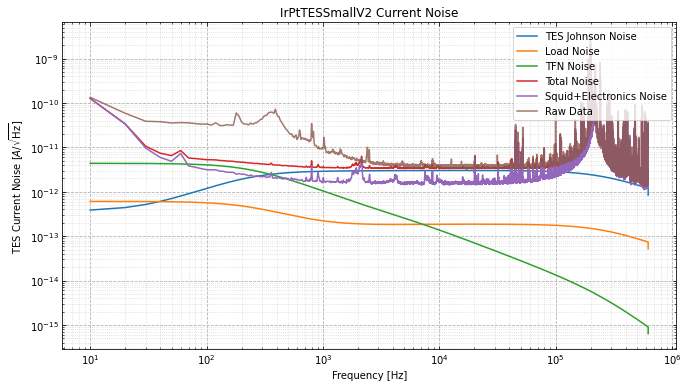

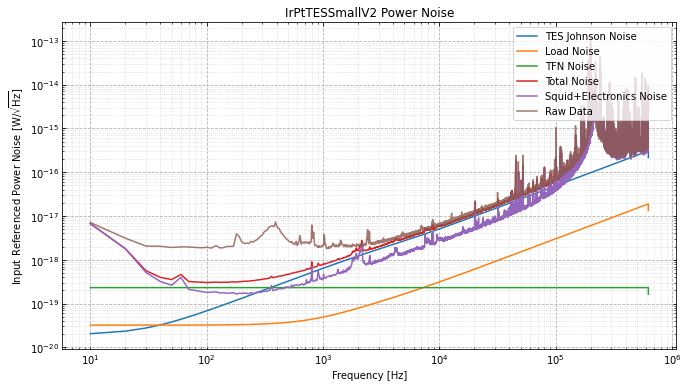


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 8.99 uA (17.1% Rn)


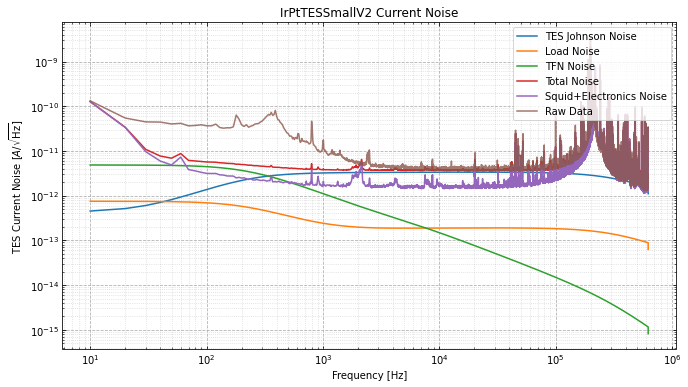

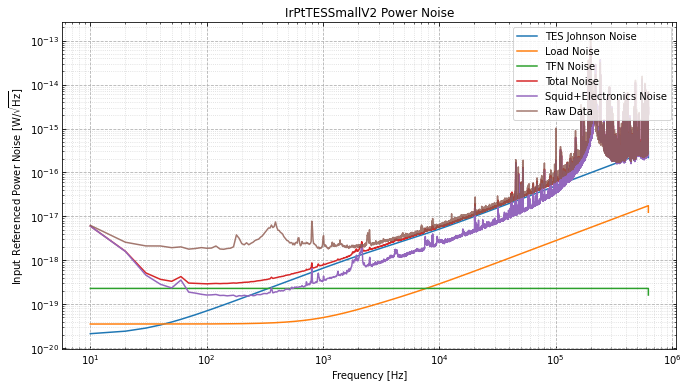


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 8.013 uA (13.6% Rn)


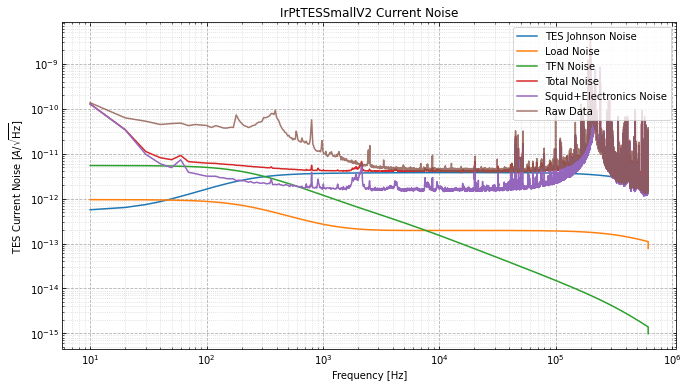

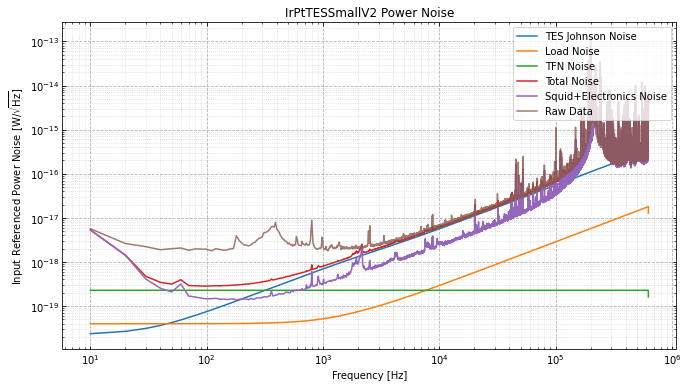


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 7.036 uA (10.4% Rn)


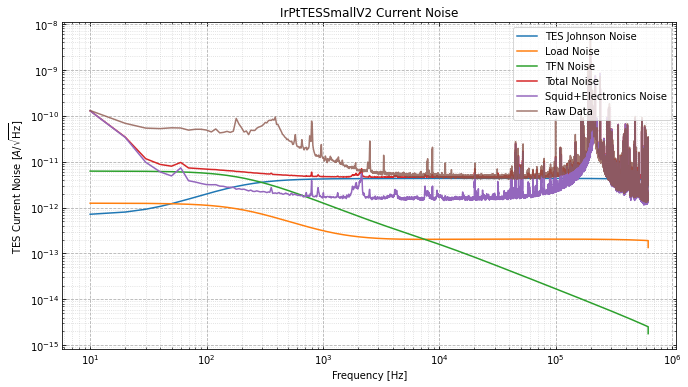

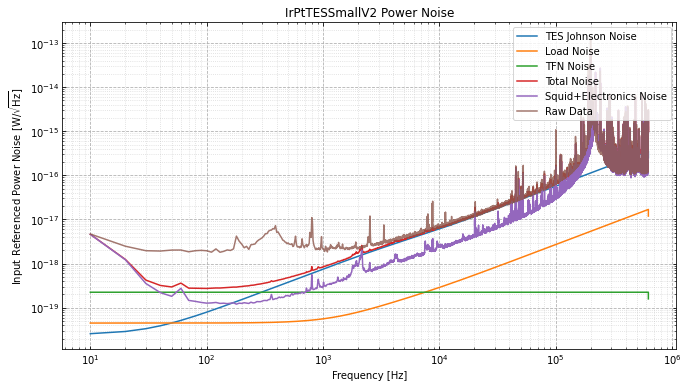


INFO: Analyzing IrPtTESSmallV2 Noise in Transition for QET bias = 5.978 uA (7.3% Rn)


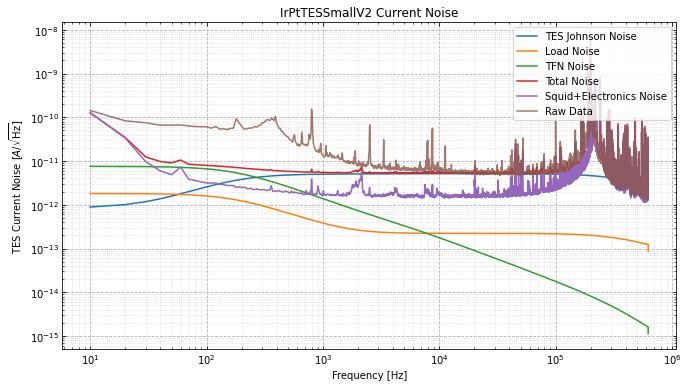

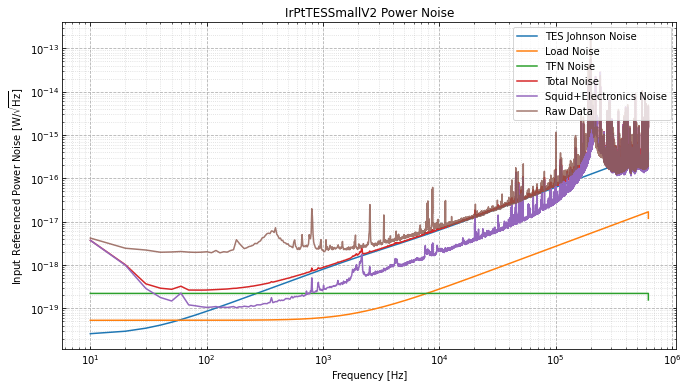

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231121_T155358/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


In [23]:
ivanalysis.analyze_noise(fit_range=(100, 1e5), poles=3, lgc_plot=True)

## Big IrPt

In [21]:
# Set Tc for each channel 
ivanalysis_big.set_tc('IrPtTESBigV2', 49.5e-3)

# SEt Tbath
ivanalysis_big.set_tbath(15e-3)

# Set Tload guess
ivanalysis_big.set_tload_guess(70e-3)


INFO: Calculating IrPtTESBigV2 SQUID noise from normal noise
INFO: Performing IrPtTESBigV2 SC Noise Fit
INFO: Channel IrPtTESBigV2 Tload from SC Fit: 69.99 mK

INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 89.982 uA (69.7% Rn)


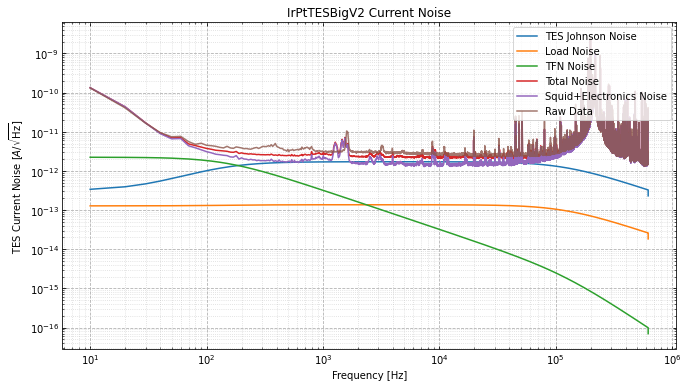

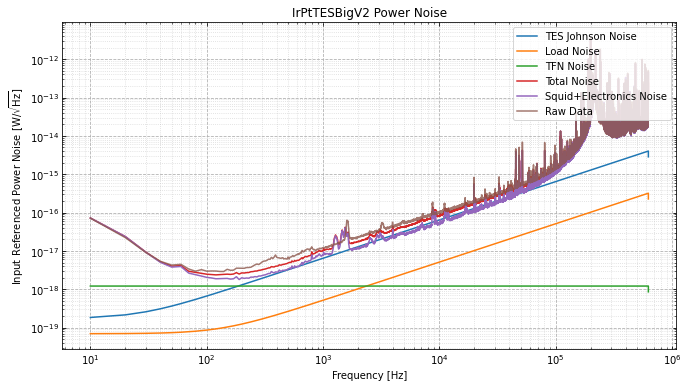


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 79.97 uA (56.7% Rn)


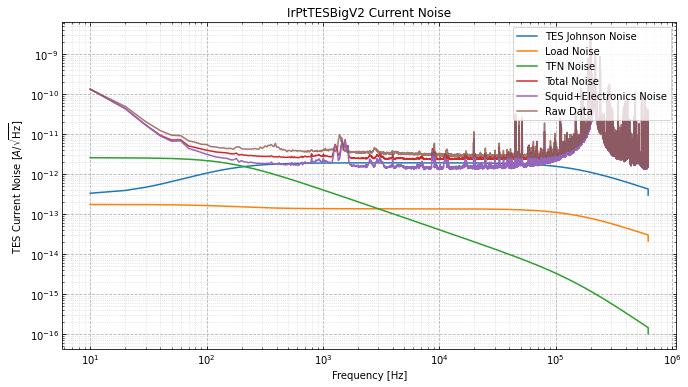

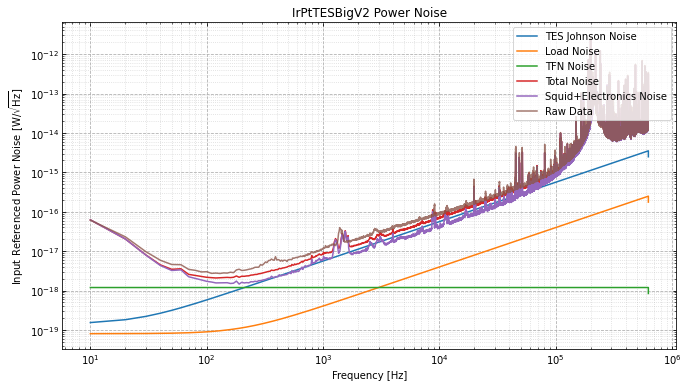


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 70.039 uA (44.4% Rn)


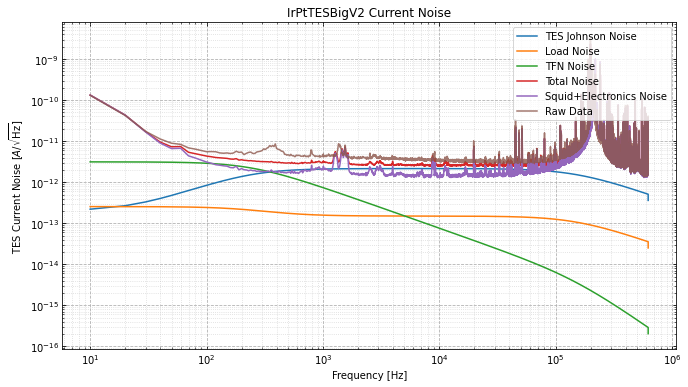

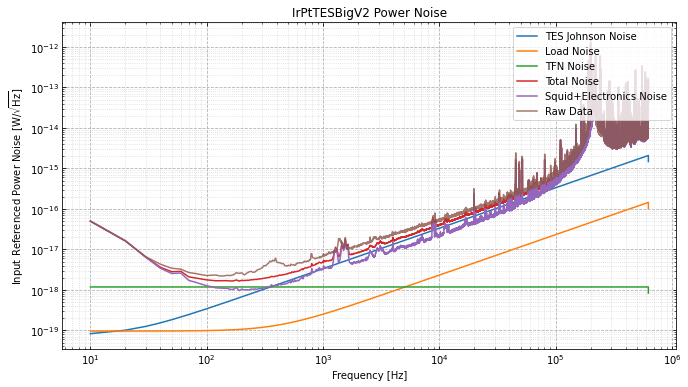


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 60.027 uA (32.7% Rn)


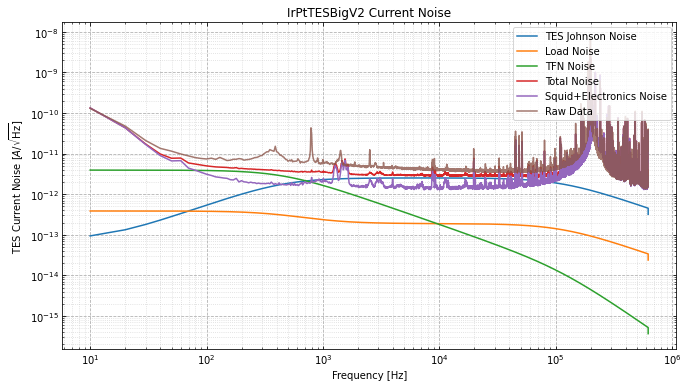

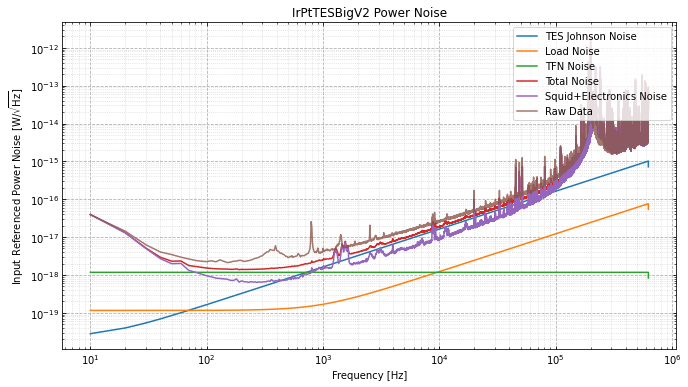


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 54.98 uA (27.3% Rn)


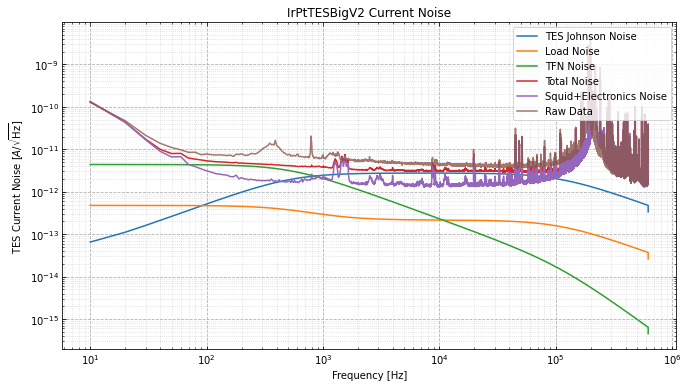

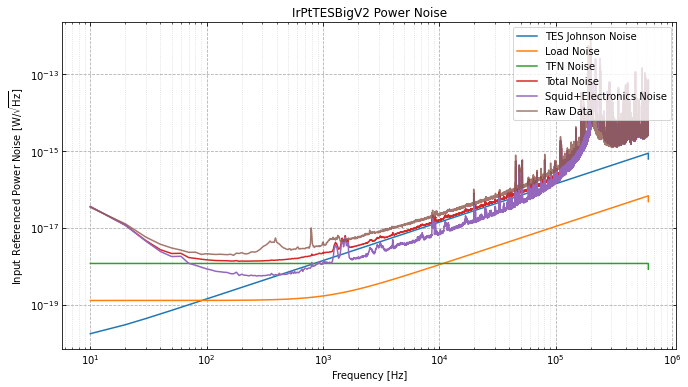


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 50.015 uA (22.5% Rn)


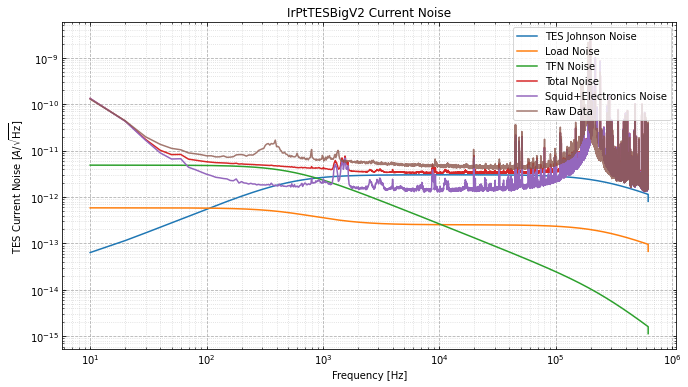

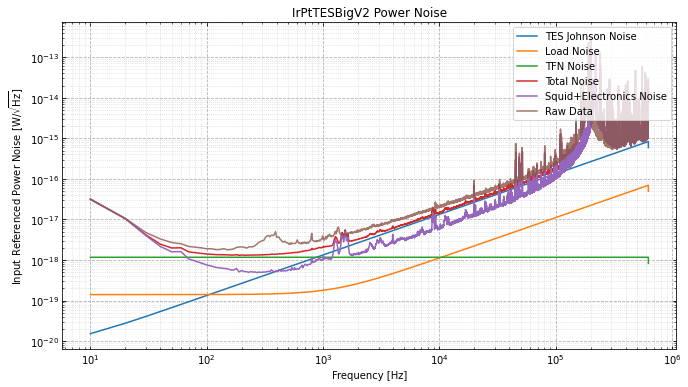


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 44.968 uA (18.0% Rn)


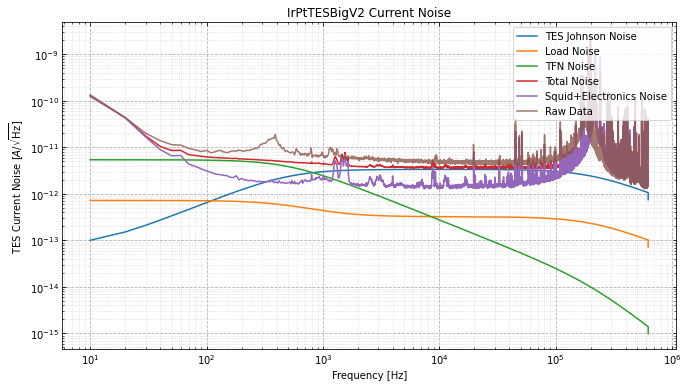

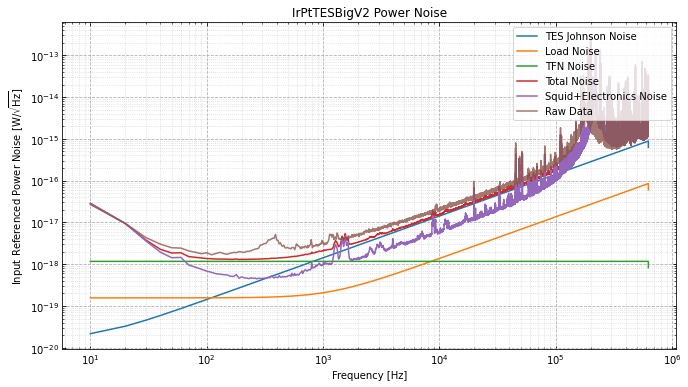


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 40.003 uA (14.0% Rn)


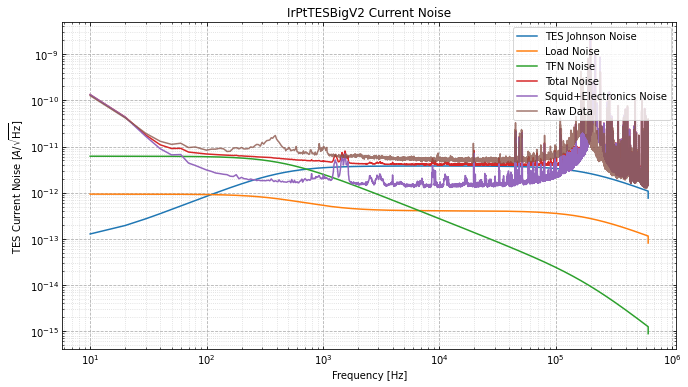

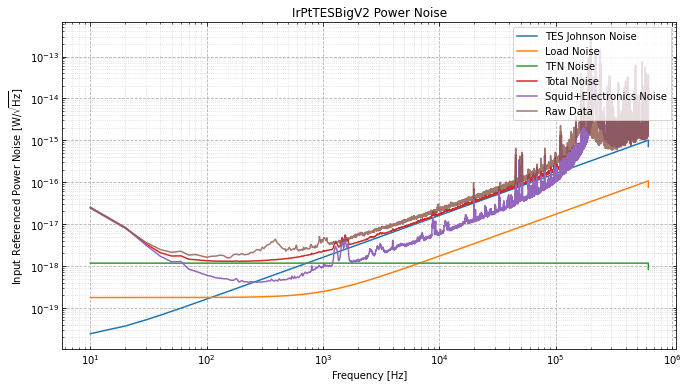


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 29.991 uA (7.5% Rn)


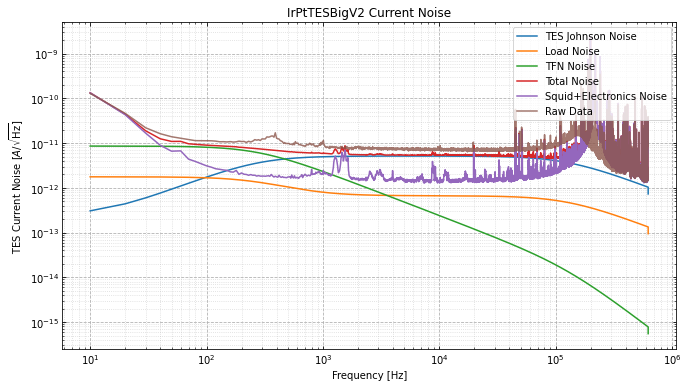

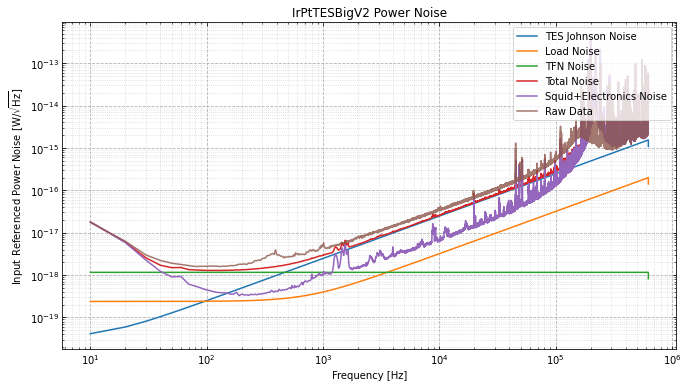

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231122_T100201/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


In [22]:
ivanalysis_big.analyze_noise(fit_range=(100, 1e5), poles=2, lgc_plot=True)

### 3pole noise modeling


INFO: Calculating IrPtTESBigV2 SQUID noise from normal noise
INFO: Performing IrPtTESBigV2 SC Noise Fit
INFO: Channel IrPtTESBigV2 Tload from SC Fit: 69.99 mK

INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 89.982 uA (69.7% Rn)


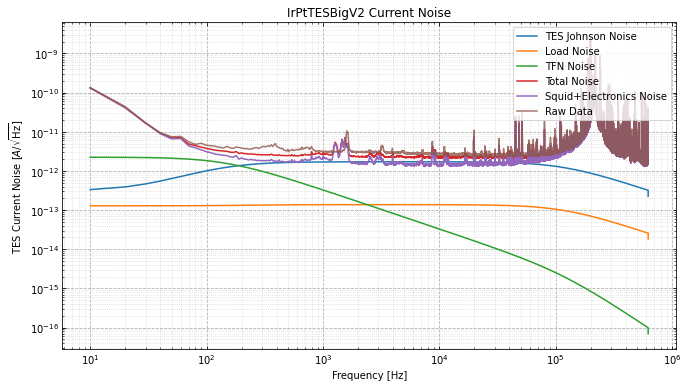

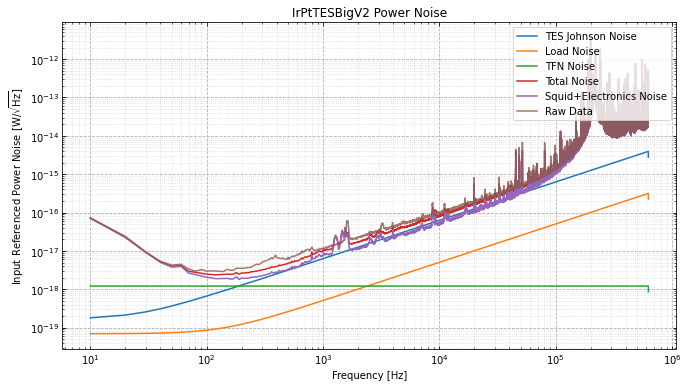


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 79.97 uA (56.7% Rn)


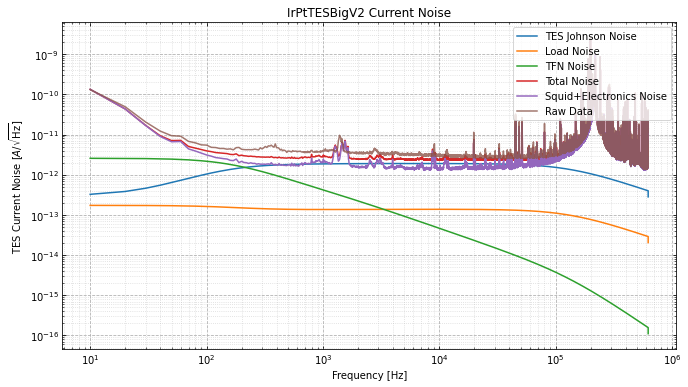

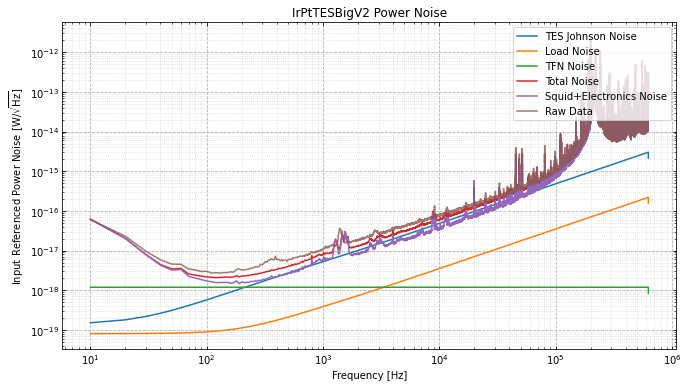


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 70.039 uA (44.4% Rn)


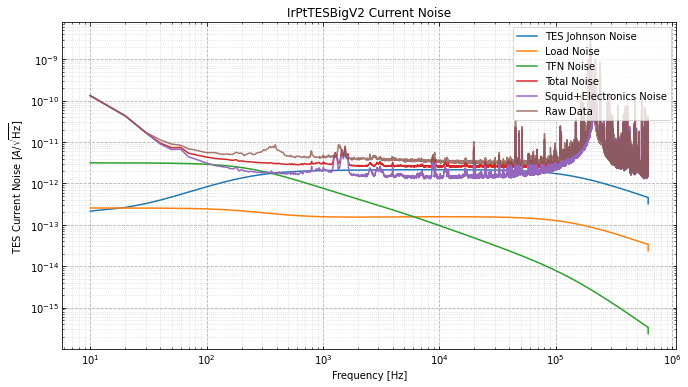

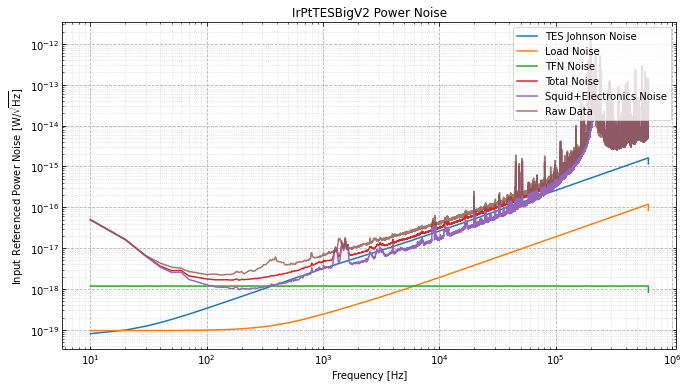


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 60.027 uA (32.7% Rn)


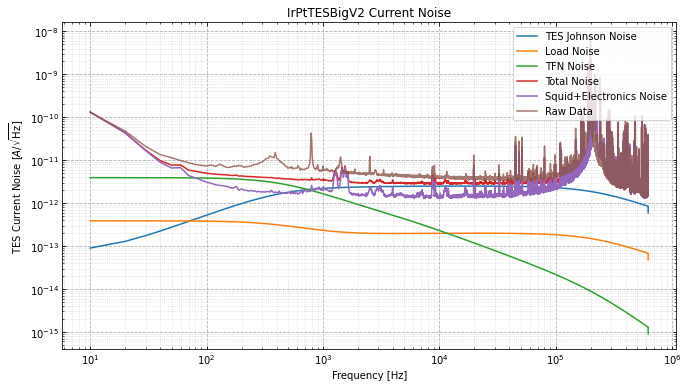

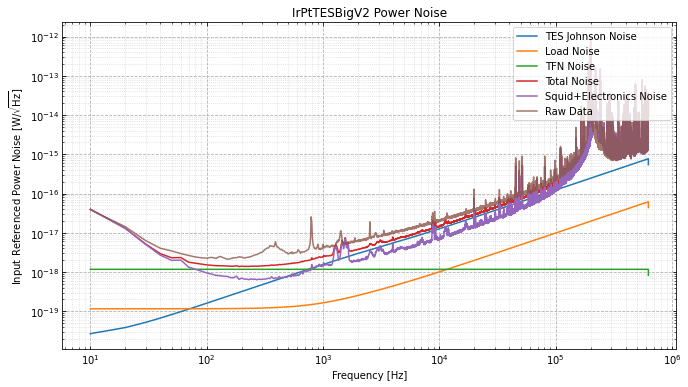


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 54.98 uA (27.3% Rn)


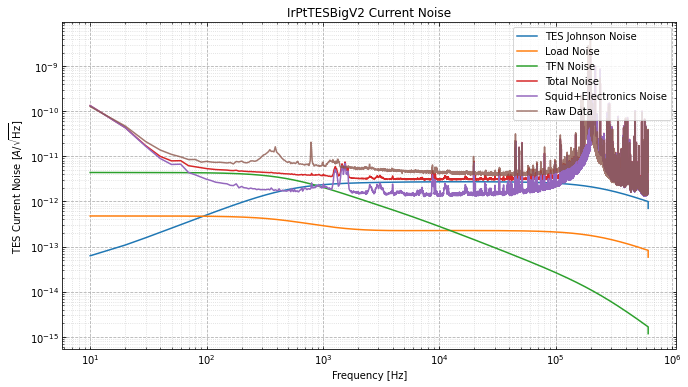

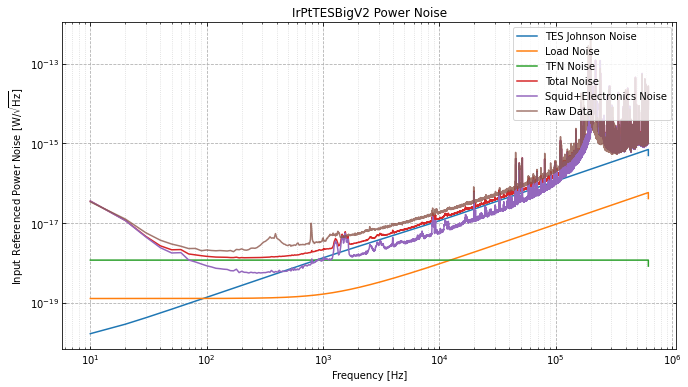


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 50.015 uA (22.5% Rn)


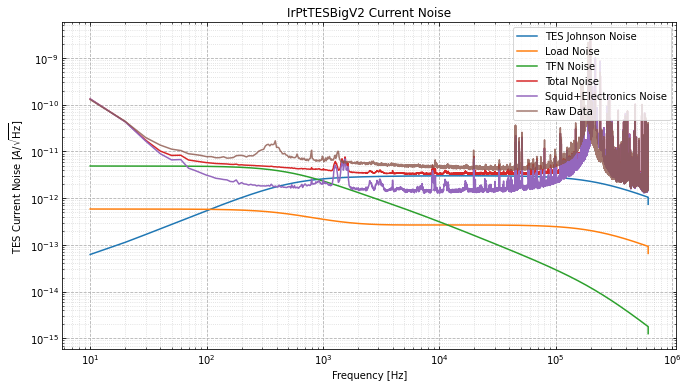

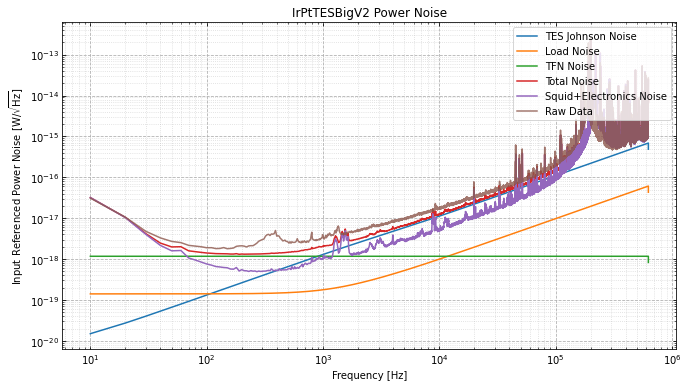


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 44.968 uA (18.0% Rn)


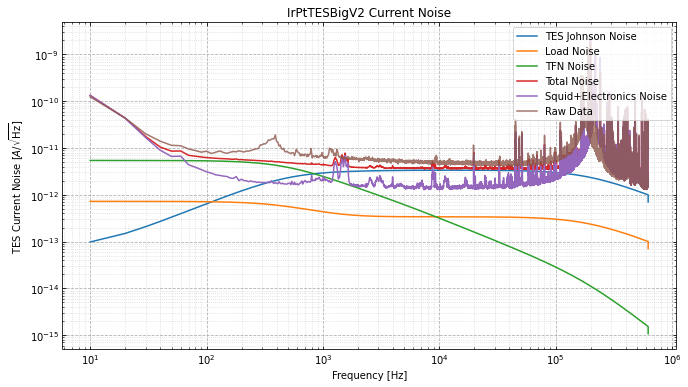

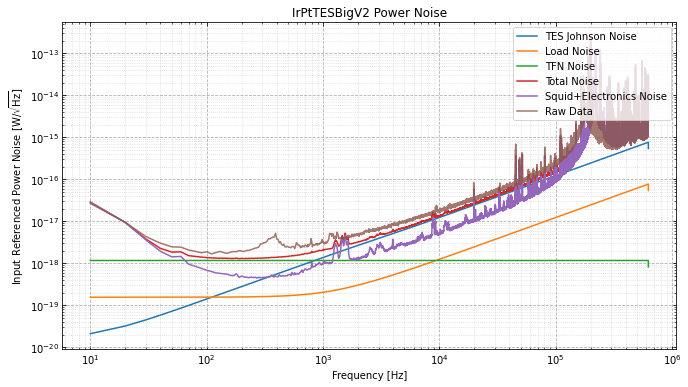


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 40.003 uA (14.0% Rn)


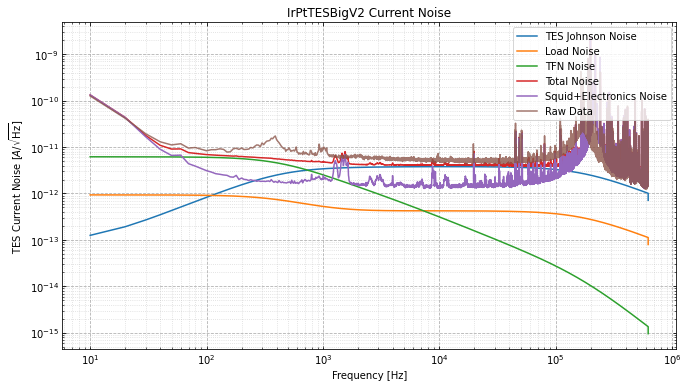

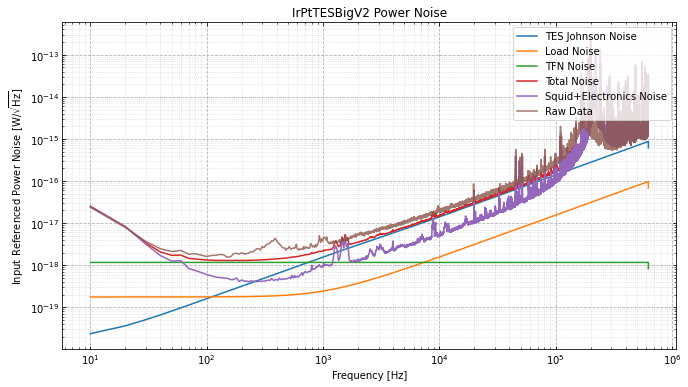


INFO: Analyzing IrPtTESBigV2 Noise in Transition for QET bias = 29.991 uA (7.5% Rn)


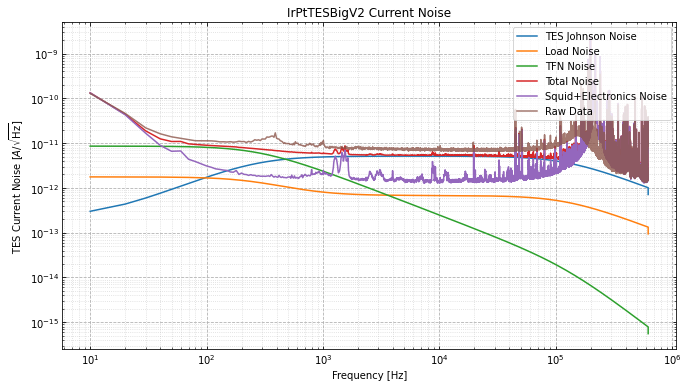

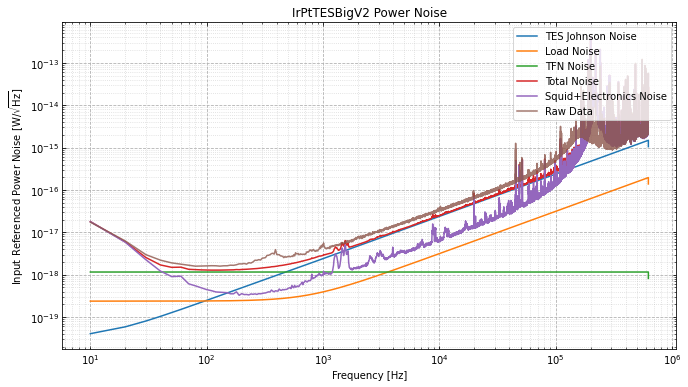

INFO: Saving filter/TES data to file /sdata2/runs/run35/filterdata/iv_didv_I2_D20231122_T100201/ivsweep_analysis_D20240529_T100813.hdf5! (overwrite=True)


In [24]:
ivanalysis_big.analyze_noise(fit_range=(100, 1e5), poles=3, lgc_plot=True)